In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
!pip install wordcloud
from wordcloud import WordCloud
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.sentiment import SentimentIntensityAnalyzer
import re
from collections import Counter
import warnings
import emoji
import re
warnings.filterwarnings('ignore')   

In [2]:
# Read CSV file and print the contents

df = pd.read_csv('test_ai_posts_historical.csv')
print(df.head()) # Read CSV file and print the contents

# Make into dataframe
df = pd.DataFrame(df)
print(df.head())

   keyword                author  \
0  chatgpt  profcpbl.bsky.social   
1       ai     alvinashcraft.com   
2  chatgpt  urologia.bsky.social   
3       ai  urologia.bsky.social   
4       ai      john.whites.site   

                                                text  \
0  I've done pretty well defending myself against...   
1  What Does ChatGPT Mean for New Software Develo...   
2  You can subscribe at\nhttps://openai.com/blog/...   
3  🧠💯💥\nI just tried the #chatGPT asking some ran...   
4  A5: In the coming years, it is likely that AI ...   

                 created_at  \
0  2024-11-25T03:00:03.351Z   
1  2024-11-22T00:38:05.262Z   
2  2024-11-27T13:27:22.167Z   
3  2024-11-27T13:17:47.557Z   
4  2024-12-06T12:27:23.653Z   

                                                 uri  like_count  \
0  at://did:plc:izkupspivve6uyzyvbcldoav/app.bsky...           0   
1  at://did:plc:tdj5ie3dprhi242wsd7ykk7k/app.bsky...           0   
2  at://did:plc:5hmxlh2ftcakxzlpuv3qhlqu/app.bsky...   

In [3]:
# Make into dataframe
df = pd.DataFrame(df)
print(df.head())

   keyword                author  \
0  chatgpt  profcpbl.bsky.social   
1       ai     alvinashcraft.com   
2  chatgpt  urologia.bsky.social   
3       ai  urologia.bsky.social   
4       ai      john.whites.site   

                                                text  \
0  I've done pretty well defending myself against...   
1  What Does ChatGPT Mean for New Software Develo...   
2  You can subscribe at\nhttps://openai.com/blog/...   
3  🧠💯💥\nI just tried the #chatGPT asking some ran...   
4  A5: In the coming years, it is likely that AI ...   

                 created_at  \
0  2024-11-25T03:00:03.351Z   
1  2024-11-22T00:38:05.262Z   
2  2024-11-27T13:27:22.167Z   
3  2024-11-27T13:17:47.557Z   
4  2024-12-06T12:27:23.653Z   

                                                 uri  like_count  \
0  at://did:plc:izkupspivve6uyzyvbcldoav/app.bsky...           0   
1  at://did:plc:tdj5ie3dprhi242wsd7ykk7k/app.bsky...           0   
2  at://did:plc:5hmxlh2ftcakxzlpuv3qhlqu/app.bsky...   

In [4]:

def clean_text(text):
    if not isinstance(text, str): 
        return ""
    text = re.sub(r"http\S+|www\S+|https\S+", "", text)
    text = emoji.demojize(text)
    text = re.sub(r"@", "", text)
    return text

df['cleaned_text'] = df['text'].apply(clean_text)




In [5]:
df.head()

,keyword,author,text,created_at,uri,like_count,repost_count,reply_count,author_display_name,has_embedded_media,cleaned_text
0,chatgpt,profcpbl.bsky.social,I've done pretty well defending myself against...,2024-11-25T03:00:03.351Z,at://did:plc:izkupspivve6uyzyvbcldoav/app.bsky...,0,0,0,C Barrington-Leigh,False,I've done pretty well defending myself against...
1,ai,alvinashcraft.com,What Does ChatGPT Mean for New Software Develo...,2024-11-22T00:38:05.262Z,at://did:plc:tdj5ie3dprhi242wsd7ykk7k/app.bsky...,0,0,0,Alvin Ashcraft,True,What Does ChatGPT Mean for New Software Develo...
2,chatgpt,urologia.bsky.social,You can subscribe at\nhttps://openai.com/blog/...,2024-11-27T13:27:22.167Z,at://did:plc:5hmxlh2ftcakxzlpuv3qhlqu/app.bsky...,0,0,0,Ioannis Goumas Uro,False,You can subscribe at\n\n\nMicheleTalso wroclaw...
3,ai,urologia.bsky.social,🧠💯💥\nI just tried the #chatGPT asking some ran...,2024-11-27T13:17:47.557Z,at://did:plc:5hmxlh2ftcakxzlpuv3qhlqu/app.bsky...,0,0,1,Ioannis Goumas Uro,True,:brain::hundred_points::collision:\nI just tri...
4,ai,john.whites.site,"A5: In the coming years, it is likely that AI ...",2024-12-06T12:27:23.653Z,at://did:plc:eha4zzrxqaezc6rxpni3dkos/app.bsky...,0,0,0,John P White,False,"A5: In the coming years, it is likely that AI ..."


In [67]:
# Get sentiment score with vader sentiment analyzer
nltk.download('vader_lexicon')
sia = SentimentIntensityAnalyzer()
df['sentiment'] = df['cleaned_text'].apply(lambda x: sia.polarity_scores(x)['compound'])
df.head()

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/isabellalatchamradusky/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


,keyword,author,text,created_at,uri,like_count,repost_count,reply_count,author_display_name,has_embedded_media,cleaned_text,sentiment,date
0,chatgpt,profcpbl.bsky.social,"I've done pretty well defending myself against #ecoanxiety by accepting loss and focusing on possibilities. \nBut is anyone else suffering increasingly acute #chatGPT anxiety? We are so, so far from ready for this, let alone what's coming -- 500x more powerful GPT4 in 2023.",2024-11-25T03:00:03.351Z,at://did:plc:izkupspivve6uyzyvbcldoav/app.bsky.feed.post/3lbqjqxk5ll27,0,0,0,C Barrington-Leigh,False,"I've done pretty well defending myself against #ecoanxiety by accepting loss and focusing on possibilities. \nBut is anyone else suffering increasingly acute #chatGPT anxiety? We are so, so far from ready for this, let alone what's coming -- 500x more powerful GPT4 in 2023.",0.4376,2024-11-25 03:00:03.351000+00:00
1,ai,alvinashcraft.com,What Does ChatGPT Mean for New Software Developers? by @integerman.\n\n#ai #learning #cloud #ChatGPT \nhttps://www.techelevator.com/what-chatgpt-means-for-new-developers/,2024-11-22T00:38:05.262Z,at://did:plc:tdj5ie3dprhi242wsd7ykk7k/app.bsky.feed.post/3lbiqgdos5k2e,0,0,0,Alvin Ashcraft,True,What Does ChatGPT Mean for New Software Developers? by integerman.\n\n#ai #learning #cloud #ChatGPT \n,0.0000,2024-11-22 00:38:05.262000+00:00
2,chatgpt,urologia.bsky.social,You can subscribe at\nhttps://openai.com/blog/chatgpt/\n\n@MicheleTalso @wroclawski_uro @DongNguyeb @miurologa @knowuro,2024-11-27T13:27:22.167Z,at://did:plc:5hmxlh2ftcakxzlpuv3qhlqu/app.bsky.feed.post/3lbwnqjovvf2y,0,0,0,Ioannis Goumas Uro,False,You can subscribe at\n\n\nMicheleTalso wroclawski_uro DongNguyeb miurologa knowuro,0.0000,2024-11-27 13:27:22.167000+00:00
3,ai,urologia.bsky.social,🧠💯💥\nI just tried the #chatGPT asking some random questions about statistics and medicine. It's #mindblowing\nYou have to try it while it is free (research phase)\n#AI\n#machinelearning\n@VickersBiostats\n@lusuardi_lukas \n@Mohamedendourol @StefaniaFerret @ameliapietr1 @trwherrmann,2024-11-27T13:17:47.557Z,at://did:plc:5hmxlh2ftcakxzlpuv3qhlqu/app.bsky.feed.post/3lbwn7f2x4u2h,0,0,1,Ioannis Goumas Uro,True,:brain::hundred_points::collision:\nI just tried the #chatGPT asking some random questions about statistics and medicine. It's #mindblowing\nYou have to try it while it is free (research phase)\n#AI\n#machinelearning\nVickersBiostats\nlusuardi_lukas \nMohamedendourol StefaniaFerret ameliapietr1 trwherrmann,0.5106,2024-11-27 13:17:47.557000+00:00
4,ai,john.whites.site,"A5: In the coming years, it is likely that AI will continue to play a significant role in the development and disruption of businesses across a wide range of sectors. (ChatGPT generated response) #CollabTalk",2024-12-06T12:27:23.653Z,at://did:plc:eha4zzrxqaezc6rxpni3dkos/app.bsky.feed.post/3lcn6lkw3322s,0,0,0,John P White,False,"A5: In the coming years, it is likely that AI will continue to play a significant role in the development and disruption of businesses across a wide range of sectors. (ChatGPT generated response) #CollabTalk",0.1779,2024-12-06 12:27:23.653000+00:00


In [68]:

# Initialize analyzer
analyzer = SentimentIntensityAnalyzer()

# Compute compound sentiment for each post
df['compound'] = df['cleaned_text'].apply(lambda x: analyzer.polarity_scores(str(x))['compound'])


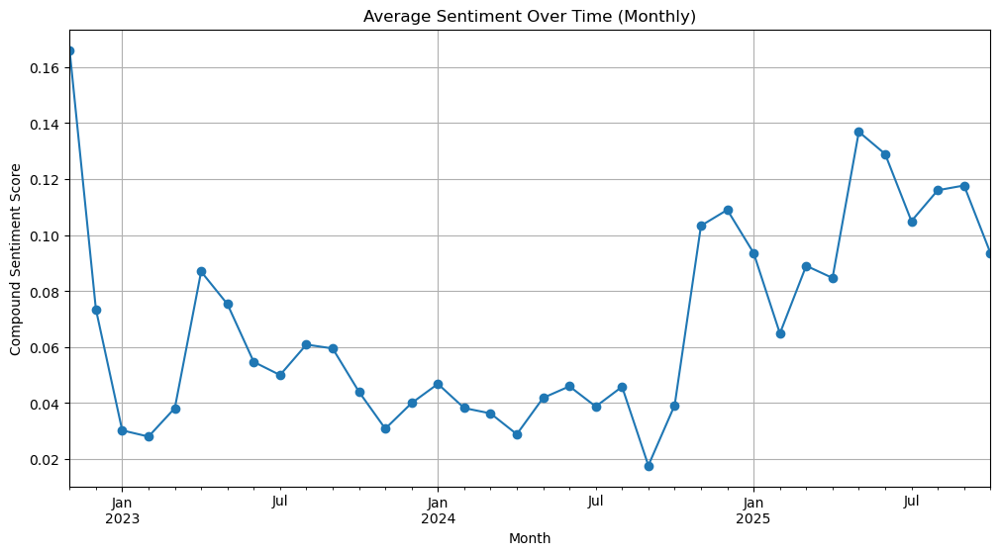

In [69]:
import pandas as pd
import matplotlib.pyplot as plt

# 1️⃣ Convert created_at to datetime and drop invalid dates
df['date'] = pd.to_datetime(df['created_at'], errors='coerce')
df = df.dropna(subset=['date', 'compound'])

# 2️⃣ Filter date range
start_date = "2022-11-01"
end_date   = "2025-11-30"

filtered_df = df[(df['date'] >= start_date) & (df['date'] <= end_date)]

# 3️⃣ Group by month and calculate average compound sentiment
sentiment_over_time = (
    filtered_df.groupby(filtered_df['date'].dt.to_period('M'))['compound'].mean()
    .to_timestamp()  # convert PeriodIndex → datetime for plotting
)

# 4️⃣ Plot
sentiment_over_time.plot(kind='line', figsize=(12, 6), marker='o')
plt.title("Average Sentiment Over Time (Monthly)")
plt.ylabel("Compound Sentiment Score")
plt.xlabel("Month")
plt.grid(True)
plt.show()


In [77]:
# Make sure you have compound scores

analyzer = SentimentIntensityAnalyzer()
df['compound'] = df['cleaned_text'].apply(lambda x: analyzer.polarity_scores(str(x))['compound'])

# Create labels
def label_sentiment(score):
    if score >= 0.05:
        return "positive"
    elif score <= -0.05:
        return "negative"
    else:
        return "neutral"

df['sentiment_label'] = df['compound'].apply(label_sentiment)



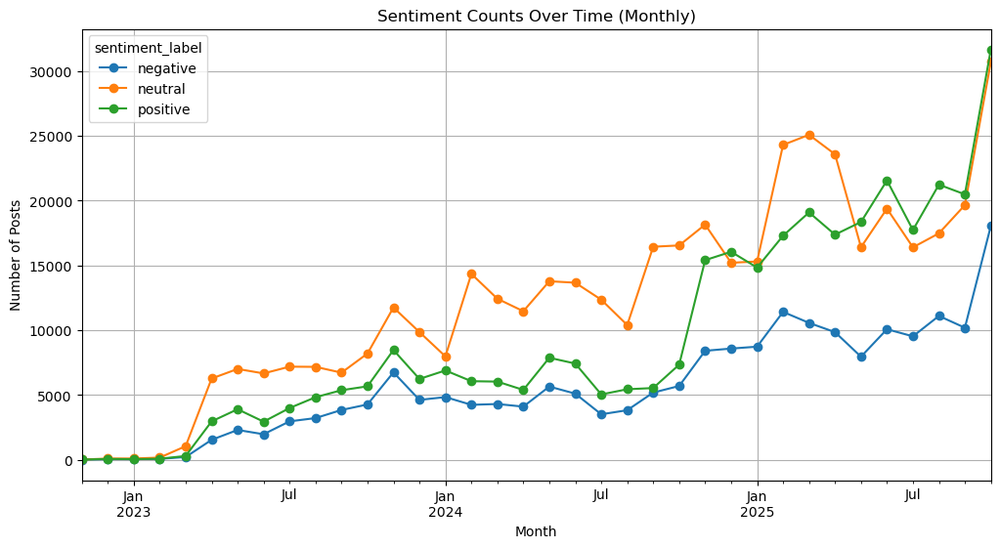

In [87]:


# ------------------------------
# 3️⃣ Convert date and filter range
# ------------------------------
df['date'] = pd.to_datetime(df['created_at'], errors='coerce')
df = df.dropna(subset=['date', 'sentiment_label'])

start_date = "2022-11-01"
end_date   = "2025-11-30"
filtered_df = df[(df['date'] >= start_date) & (df['date'] <= end_date)]

# ------------------------------
# 4️⃣ Group by month and sentiment
# ------------------------------
sentiment_over_time = (
    filtered_df.groupby([filtered_df['date'].dt.to_period('M'), 'sentiment_label'])
    .size()
    .unstack(fill_value=0)  # columns = positive, neutral, negative
    .to_timestamp()         # convert PeriodIndex → datetime for plotting
)

# ------------------------------
# 5️⃣ Plot
# ------------------------------
sentiment_over_time.plot(kind='line', figsize=(12, 6), marker='o')
plt.title("Sentiment Counts Over Time (Monthly)")
plt.xlabel("Month")
plt.ylabel("Number of Posts")
plt.grid(True)
plt.show()


In [75]:
# Example: weighted sum of engagement metrics
df['virality'] = df['like_count'] + df['repost_count'] + df['reply_count']


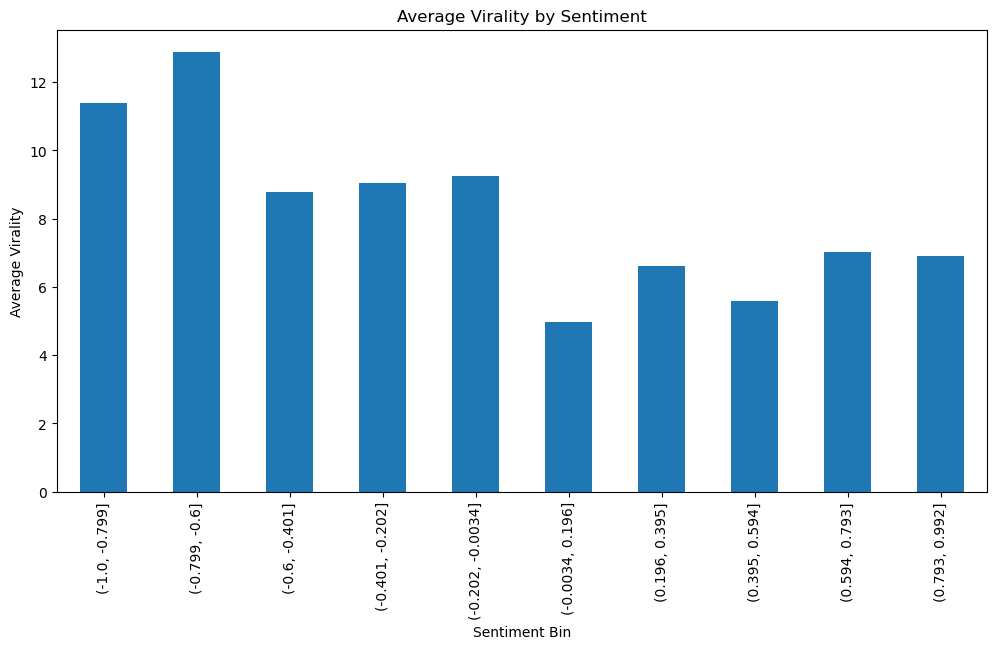

In [ ]:


analyzer = SentimentIntensityAnalyzer()
df['compound'] = df['cleaned_text'].apply(lambda x: analyzer.polarity_scores(str(x))['compound'])

# Bin sentiment into 10 buckets
df['sentiment_bin'] = pd.cut(df['compound'], bins=10)

# Compute average virality per bin
avg_virality = df.groupby('sentiment_bin')['virality'].mean()

# Plot
avg_virality.plot(kind='histogram', figsize=(12, 6))
plt.title("Average Virality by Sentiment")
plt.ylabel("Average Virality")
plt.xlabel("Sentiment Bin")
plt.show()



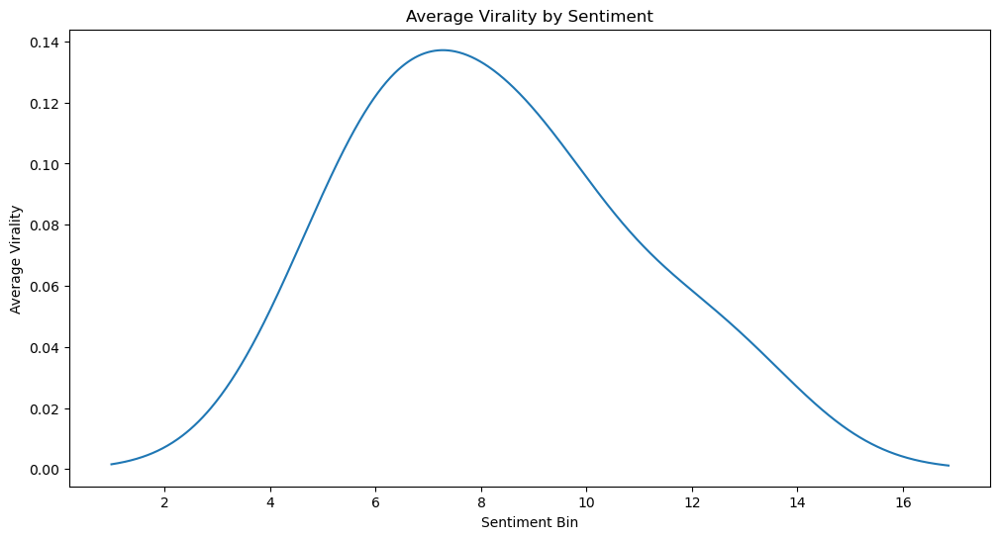

In [84]:
avg_virality.plot(kind='density', figsize=(12, 6))
plt.title("Average Virality by Sentiment")
plt.ylabel("Average Virality")
plt.xlabel("Sentiment Bin")
plt.show()

In [6]:
import pandas as pd

# Example list of job-related keywords
job_keywords = [
    "job", "jobs", "hiring", "career", "position", "interview", 
    "salary", "employment", "work", "role", "vacancy", "recruitment"
]

# Make a regex pattern for any of these keywords
pattern = "|".join(job_keywords)

# Filter dataframe (case-insensitive)
job_df = df[df["cleaned_text"].str.contains(pattern, case=False, na=False)]

# Reset index for cleanliness
job_df = job_df.reset_index(drop=True)

print(f"Number of job-related posts: {len(job_df)}")
job_df.head(10)


Number of job-related posts: 74529


,keyword,author,text,created_at,uri,like_count,repost_count,reply_count,author_display_name,has_embedded_media,cleaned_text
0,ai,john.whites.site,"A5: In the coming years, it is likely that AI ...",2024-12-06T12:27:23.653Z,at://did:plc:eha4zzrxqaezc6rxpni3dkos/app.bsky...,0,0,0,John P White,False,"A5: In the coming years, it is likely that AI ..."
1,chatgpt,jorgeorchilles.bsky.social,ChatGPT for Offensive Security video followed ...,2024-11-24T07:11:01.950Z,at://did:plc:qfuha4d2jzek2jhmemjkiui6/app.bsky...,0,0,1,Jorge Orchilles,False,ChatGPT for Offensive Security video followed ...
2,chatgpt,jholston.bsky.social,"""been having a blast with ChatGPT. In the past...",2024-11-19T02:45:37.523Z,at://did:plc:so2fnehffqkhq34asodug5aw/app.bsky...,0,0,0,JB Holston,True,"""been having a blast with ChatGPT. In the past..."
3,chatgpt,socworkpodcast.bsky.social,This tweet thread brought to you by #ChatGPT a...,2024-11-22T20:14:37.272Z,at://did:plc:wgncrohorvky4xdo6a2ank4t/app.bsky...,0,0,0,Social Work Podcast,False,This tweet thread brought to you by #ChatGPT a...
4,chatgpt,schmoller.net,Illuminating experiment with ChatGPT by Lex To...,2024-11-04T21:35:58.685Z,at://did:plc:7ozv52xitkpjflxhygf5c65b/app.bsky...,0,0,0,Seb Schmoller,True,Illuminating experiment with ChatGPT by Lex To...
5,chatgpt,infotainment.bsky.social,Statistical learning in action. #ChatGPT does ...,2024-11-18T02:57:06.536Z,at://did:plc:33ieaned7xdijudn4olv6whh/app.bsky...,0,0,0,Jay Patel,True,Statistical learning in action. #ChatGPT does ...
6,chatgpt,infotainment.bsky.social,Statistical learning in action. #ChatGPT does ...,2025-01-03T04:38:44.047Z,at://did:plc:33ieaned7xdijudn4olv6whh/app.bsky...,0,0,0,Jay Patel,True,Statistical learning in action. #ChatGPT does ...
7,chatgpt,rakeshyadav.bsky.social,"In 1 day, ChatGPT has quickly become my buddy ...",2024-11-22T12:06:14.456Z,at://did:plc:bwlhr2w4sp6vrdz4mwt5bi2d/app.bsky...,0,0,0,Rakesh Yadav,False,"In 1 day, ChatGPT has quickly become my buddy ..."
8,chatgpt,markantonyowen.com,Asked @OpenAI's ChatGPT (Dec 15 version) to wr...,2024-12-11T06:51:46.358Z,at://did:plc:tqaukzibm7e5oajmpqn6jk7a/app.bsky...,0,0,0,𝕄𝕒𝕣𝕜 𝔸𝕟𝕥𝕠𝕟𝕪 𝕆𝕨𝕖𝕟,True,Asked OpenAI's ChatGPT (Dec 15 version) to wri...
9,chatgpt,knut.fyi,Working in a SaaS and not sure what to do for ...,2024-11-07T16:00:37.586Z,at://did:plc:kg7rc2ofcnomsff4bgcooyhf/app.bsky...,0,0,0,knut,False,Working in a SaaS and not sure what to do for ...


In [7]:
# --- Step 0: Imports ---
import pandas as pd
from nltk.sentiment import SentimentIntensityAnalyzer
import nltk
import matplotlib.pyplot as plt

# Download required resources
nltk.download('vader_lexicon')

# --- Step 1: Initialize VADER ---
sia = SentimentIntensityAnalyzer()

# --- Step 2: Sentiment analysis ---
# Use original text if available, otherwise cleaned_text
job_df['sentiment_scores'] = job_df['cleaned_text'].apply(lambda x: sia.polarity_scores(str(x)))

# Extract compound score
job_df['compound'] = job_df['sentiment_scores'].apply(lambda x: x['compound'])

# --- Step 3: Assign sentiment labels ---
def get_label(score):
    if score >= 0.05:
        return 'positive'
    elif score <= -0.05:
        return 'negative'
    else:
        return 'neutral'

job_df['sentiment_label'] = job_df['compound'].apply(get_label)

# --- Step 4: Count sentiment categories ---
sentiment_counts = job_df['sentiment_label'].value_counts()
print("Sentiment Counts:\n", sentiment_counts)

# --- Step 5: Inspect results ---
job_df[['cleaned_text', 'compound', 'sentiment_label']].head(10)


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/isabellalatchamradusky/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


Sentiment Counts:
 sentiment_label
positive    38282
negative    18366
neutral     17881
Name: count, dtype: int64


,cleaned_text,compound,sentiment_label
0,"A5: In the coming years, it is likely that AI ...",0.1779,positive
1,ChatGPT for Offensive Security video followed ...,0.5531,positive
2,"""been having a blast with ChatGPT. In the past...",0.6597,positive
3,This tweet thread brought to you by #ChatGPT a...,0.2732,positive
4,Illuminating experiment with ChatGPT by Lex To...,0.4019,positive
5,Statistical learning in action. #ChatGPT does ...,0.2960,positive
6,Statistical learning in action. #ChatGPT does ...,0.2960,positive
7,"In 1 day, ChatGPT has quickly become my buddy ...",0.4344,positive
8,Asked OpenAI's ChatGPT (Dec 15 version) to wri...,0.4404,positive
9,Working in a SaaS and not sure what to do for ...,0.8699,positive


Number of positive posts: 38282


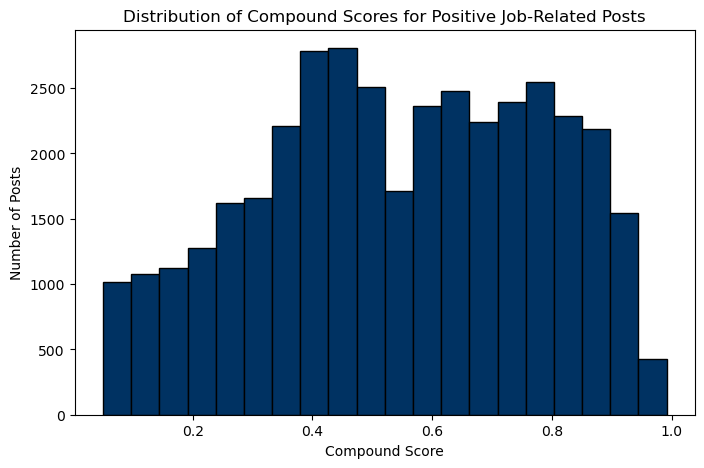

,cleaned_text,compound
0,"A5: In the coming years, it is likely that AI ...",0.1779
1,ChatGPT for Offensive Security video followed ...,0.5531
2,"""been having a blast with ChatGPT. In the past...",0.6597
3,This tweet thread brought to you by #ChatGPT a...,0.2732
4,Illuminating experiment with ChatGPT by Lex To...,0.4019
5,Statistical learning in action. #ChatGPT does ...,0.2960
6,Statistical learning in action. #ChatGPT does ...,0.2960
7,"In 1 day, ChatGPT has quickly become my buddy ...",0.4344
8,Asked OpenAI's ChatGPT (Dec 15 version) to wri...,0.4404
9,Working in a SaaS and not sure what to do for ...,0.8699


In [8]:
# Filter only positive posts
positive_posts = job_df[job_df['sentiment_label'] == 'positive']

# Optional: see how many positive posts
print(f"Number of positive posts: {len(positive_posts)}")

# Plot the distribution of compound scores for positive posts
plt.figure(figsize=(8,5))
plt.hist(positive_posts['compound'], bins=20, color='#003262', edgecolor='black')
plt.title('Distribution of Compound Scores for Positive Job-Related Posts')
plt.xlabel('Compound Score')
plt.ylabel('Number of Posts')
plt.show()

# Inspect some of the top positive posts
positive_posts[['cleaned_text', 'compound']].head(10)


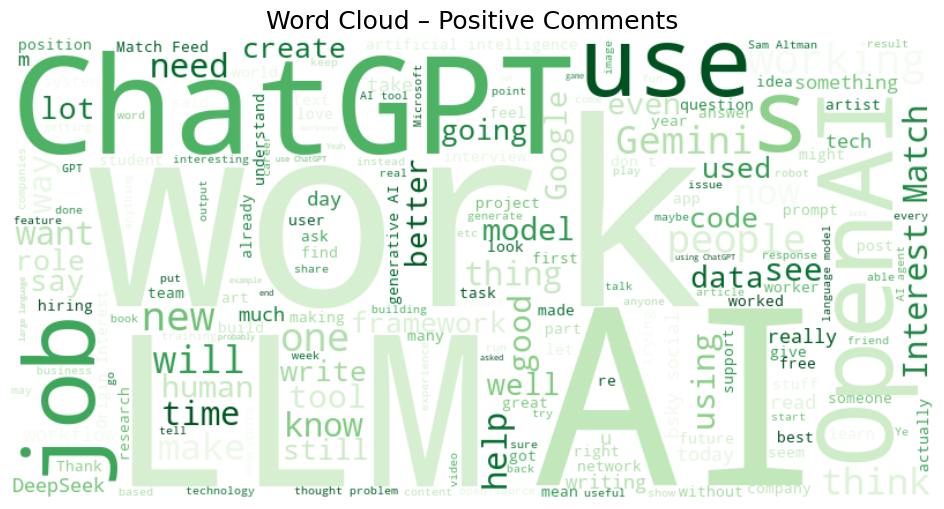

In [9]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Filter only positive comments
positive_text = " ".join(
    job_df[job_df['sentiment_label'] == 'positive']['cleaned_text'].astype(str)
)

# Generate word cloud
wordcloud = WordCloud(
    width=800,
    height=400,
    background_color='white',
    colormap='Greens',   # Optional: green color palette for positive sentiment
    max_words=200
).generate(positive_text)

# Display
plt.figure(figsize=(12, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title("Word Cloud – Positive Comments", fontsize=18)
plt.axis('off')
plt.show()


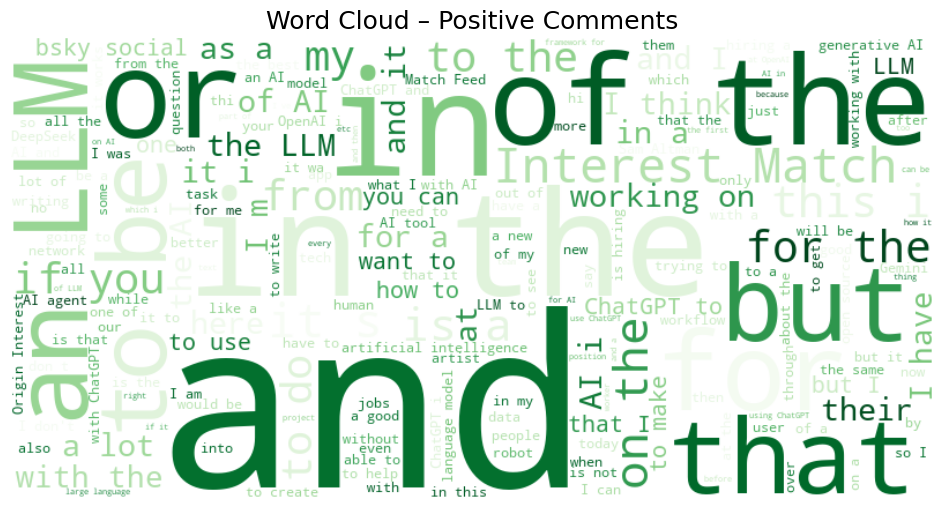

In [10]:
custom_stopwords = {"job", "role", "work", "company"}  # add any words you want to hide

wordcloud = WordCloud(
    width=800, height=400, background_color='white',
    colormap='Greens',
    stopwords=custom_stopwords
).generate(positive_text)

# Display
plt.figure(figsize=(12, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title("Word Cloud – Positive Comments", fontsize=18)
plt.axis('off')
plt.show()


In [11]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import NMF

pos_texts = job_df[job_df['sentiment_label']=='positive']['cleaned_text'].astype(str)

vectorizer = TfidfVectorizer(stop_words='english')
X = vectorizer.fit_transform(pos_texts)

nmf = NMF(n_components=3, random_state=42)  # choose number of themes
W = nmf.fit_transform(X)
H = nmf.components_

terms = vectorizer.get_feature_names_out()
for idx, topic in enumerate(H):
    top_terms = [terms[i] for i in topic.argsort()[-10:]]
    print(f"Topic {idx+1}: {top_terms}")


Topic 1: ['don', 'people', 'job', 'just', 'use', 'like', 'llm', 'chatgpt', 'work', 'ai']
Topic 2: ['california', 'san', 'round_pushpin', 'francisco', 'united', 'hiring', 'jobsearch', 'loudspeaker', 'jobalert', 'openai']
Topic 3: ['tools', 'editing', 'image', 'powered', 'new', 'features', 'workspace', 'ai', 'google', 'gemini']


In [12]:
# --- Descriptive statistics for sentiment ---
desc_stats = job_df['compound'].describe()
print("Descriptive Statistics for Compound Sentiment:\n")
print(desc_stats)

# Optional: include sentiment counts
sentiment_counts = job_df['sentiment_label'].value_counts()
print("\nSentiment Label Counts:\n")
print(sentiment_counts)

# Optional: percentages of each sentiment
sentiment_percent = job_df['sentiment_label'].value_counts(normalize=True) * 100
print("\nSentiment Label Percentages:\n")
print(sentiment_percent)

Descriptive Statistics for Compound Sentiment:

count    74529.000000
mean         0.163838
std          0.472194
min         -0.994400
25%         -0.025800
50%          0.097100
75%          0.557400
max          0.991600
Name: compound, dtype: float64

Sentiment Label Counts:

sentiment_label
positive    38282
negative    18366
neutral     17881
Name: count, dtype: int64

Sentiment Label Percentages:

sentiment_label
positive    51.365240
negative    24.642757
neutral     23.992003
Name: proportion, dtype: float64


In [13]:
# Filter out any positive comments that contain "gemini"
filtered_df = job_df[
    (job_df['sentiment_label'] == 'positive') &
    (~job_df['cleaned_text'].str.contains(r'\bgemini\b', case=False, na=False))
]

# Select the top 20 most positive comments
top_positive_samples = filtered_df.nlargest(20, 'compound')[['cleaned_text', 'compound']]

top_positive_samples


,cleaned_text,compound
53395,What I'm imagining is the following\n\nShareho...,0.9899
13996,Thank you. I’m so glad you like it. I wish I c...,0.9841
44241,A few well-meaning friends asked me if there w...,0.9840
27758,Getting the best results out of an #LLM is lik...,0.9806
27959,"Fantastic, thank you!\n\nUsing LLM as a smart ...",0.9804
16958,"Love fairy wisdom: ""OpenAI and the military wo...",0.9800
50248,I HAVE NOT (yet) but would love to. \n\nI work...,0.9796
8690,One of my good friends has decided to write so...,0.9791
12767,I cant fuggin quote it but YES :sparkles::spar...,0.9788
53104,"I want to do, but really don't know how, espec...",0.9787


In [14]:
!pip install nrclex

from nrclex import NRCLex

def get_emotions(text):
    e = NRCLex(text)
    return e.top_emotions

job_df['positive_emotions'] = job_df.apply(
    lambda row: get_emotions(row['cleaned_text']) 
                if row['sentiment_label']=='positive' else None,
    axis=1
)

job_df[['cleaned_text','positive_emotions']].head()

from collections import Counter

emotion_counter = Counter()
for e in job_df['positive_emotions'].dropna():
    for emotion, score in e:
        emotion_counter[emotion] += score

emotion_counter



Counter({'positive': 12431.354113333375,
         'trust': 3145.070152749229,
         'anticipation': 2059.1551719984186,
         'negative': 1848.793292943789,
         'joy': 770.5897343162543,
         'fear': 701.7027388401882,
         'anger': 470.20690255382317,
         'surprise': 429.0421997411493,
         'sadness': 402.37430760244354,
         'disgust': 229.4838442237075,
         'anticip': 0.0})

In [15]:
job_df['date'] = pd.to_datetime(job_df['created_at'], errors='coerce')
job_df.head()

,keyword,author,text,created_at,uri,like_count,repost_count,reply_count,author_display_name,has_embedded_media,cleaned_text,sentiment_scores,compound,sentiment_label,positive_emotions,date
0,ai,john.whites.site,"A5: In the coming years, it is likely that AI ...",2024-12-06T12:27:23.653Z,at://did:plc:eha4zzrxqaezc6rxpni3dkos/app.bsky...,0,0,0,John P White,False,"A5: In the coming years, it is likely that AI ...","{'neg': 0.07, 'neu': 0.812, 'pos': 0.118, 'com...",0.1779,positive,"[(anticipation, 0.25)]",2024-12-06 12:27:23.653000+00:00
1,chatgpt,jorgeorchilles.bsky.social,ChatGPT for Offensive Security video followed ...,2024-11-24T07:11:01.950Z,at://did:plc:qfuha4d2jzek2jhmemjkiui6/app.bsky...,0,0,1,Jorge Orchilles,False,ChatGPT for Offensive Security video followed ...,"{'neg': 0.087, 'neu': 0.694, 'pos': 0.219, 'co...",0.5531,positive,"[(positive, 0.5)]",2024-11-24 07:11:01.950000+00:00
2,chatgpt,jholston.bsky.social,"""been having a blast with ChatGPT. In the past...",2024-11-19T02:45:37.523Z,at://did:plc:so2fnehffqkhq34asodug5aw/app.bsky...,0,0,0,JB Holston,True,"""been having a blast with ChatGPT. In the past...","{'neg': 0.0, 'neu': 0.865, 'pos': 0.135, 'comp...",0.6597,positive,"[(trust, 0.2), (negative, 0.2), (anticipation,...",2024-11-19 02:45:37.523000+00:00
3,chatgpt,socworkpodcast.bsky.social,This tweet thread brought to you by #ChatGPT a...,2024-11-22T20:14:37.272Z,at://did:plc:wgncrohorvky4xdo6a2ank4t/app.bsky...,0,0,0,Social Work Podcast,False,This tweet thread brought to you by #ChatGPT a...,"{'neg': 0.0, 'neu': 0.905, 'pos': 0.095, 'comp...",0.2732,positive,"[(positive, 1.0)]",2024-11-22 20:14:37.272000+00:00
4,chatgpt,schmoller.net,Illuminating experiment with ChatGPT by Lex To...,2024-11-04T21:35:58.685Z,at://did:plc:7ozv52xitkpjflxhygf5c65b/app.bsky...,0,0,0,Seb Schmoller,True,Illuminating experiment with ChatGPT by Lex To...,"{'neg': 0.091, 'neu': 0.737, 'pos': 0.171, 'co...",0.4019,positive,"[(trust, 0.25), (surprise, 0.25), (negative, 0...",2024-11-04 21:35:58.685000+00:00


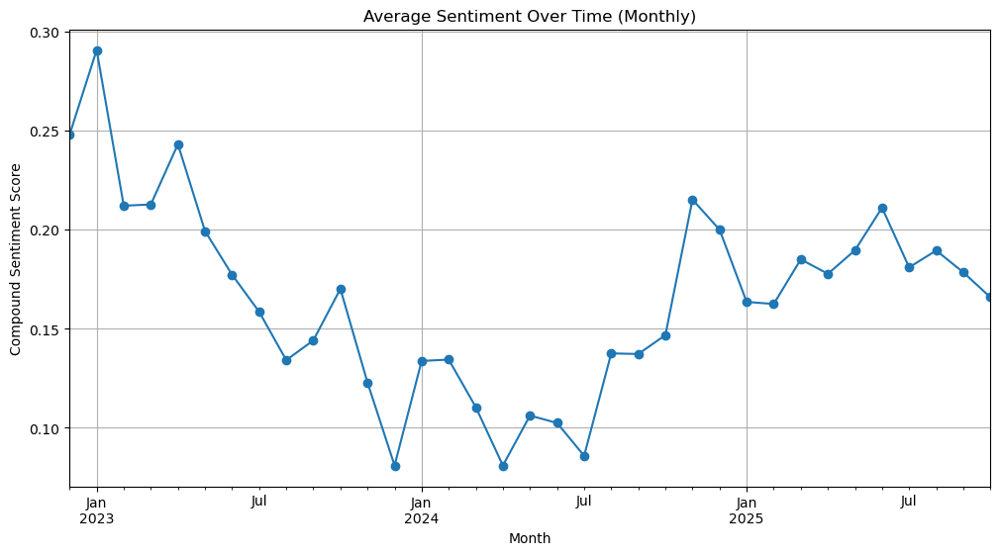

In [16]:
# Convert created_at to datetime
job_df['date'] = pd.to_datetime(job_df['created_at'], errors='coerce')

# Filter date range
start_date = "2022-11-01"
end_date   = "2025-11-30"   # end of Nov 2025

filtered_df = job_df[(job_df['date'] >= start_date) & (job_df['date'] <= end_date)]

# Group by month and take average compound sentiment
sentiment_over_time = filtered_df.groupby(filtered_df['date'].dt.to_period('M'))['compound'].mean()

# Plot
sentiment_over_time.plot(kind='line', figsize=(12, 6), marker='o')
plt.title("Average Sentiment Over Time (Monthly)")
plt.ylabel("Compound Sentiment Score")
plt.xlabel("Month")
plt.grid(True)
plt.show()


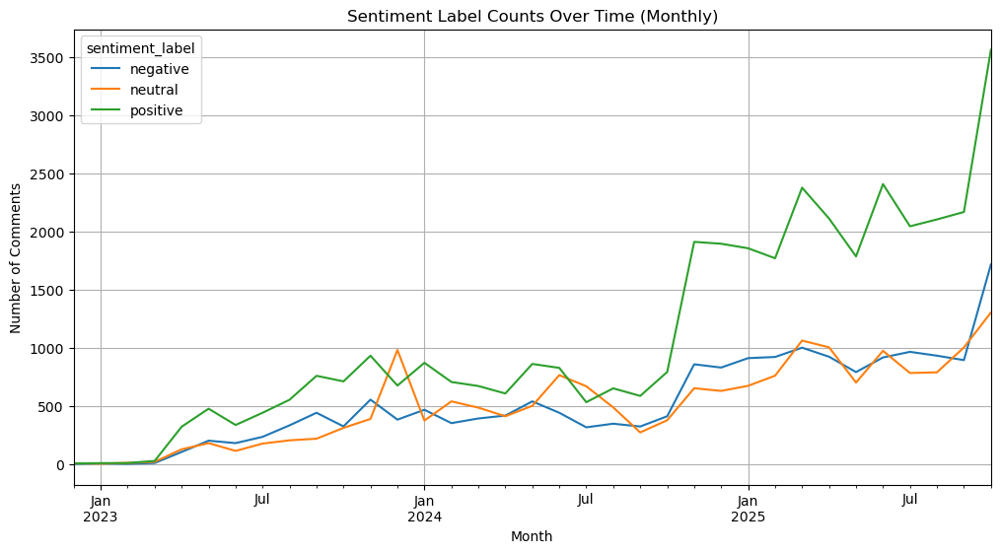

In [17]:
sentiment_labels_over_time = job_df.groupby([
    job_df['date'].dt.to_period('M'),
    'sentiment_label'
]).size().unstack(fill_value=0)

sentiment_labels_over_time.plot(kind='line', figsize=(12, 6))
plt.title("Sentiment Label Counts Over Time (Monthly)")
plt.ylabel("Number of Comments")
plt.xlabel("Month")
plt.grid(True)
plt.show()


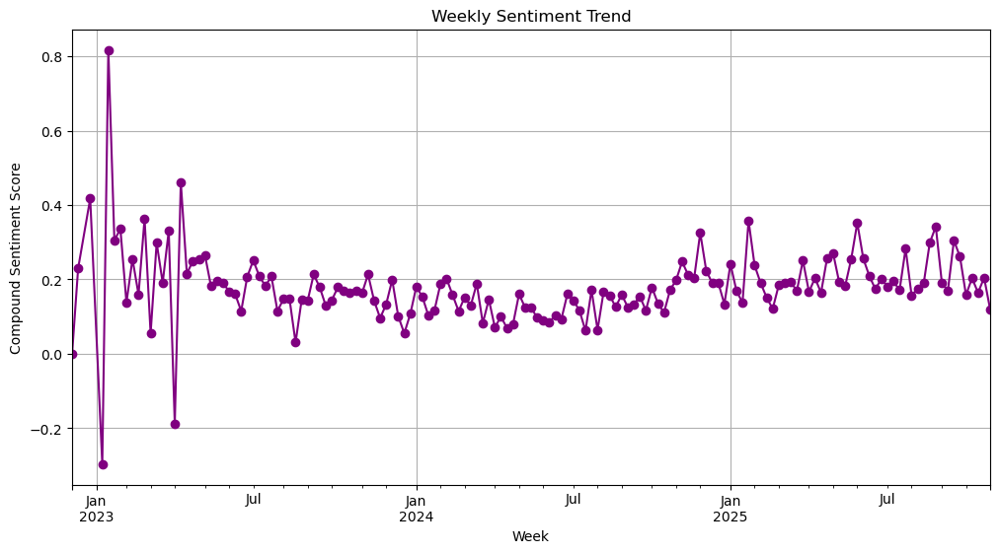

In [18]:
weekly_sentiment = job_df.groupby(job_df['date'].dt.to_period('W'))['compound'].mean()

weekly_sentiment.plot(kind='line', figsize=(12,6), marker='o', color='purple')
plt.title("Weekly Sentiment Trend")
plt.ylabel("Compound Sentiment Score")
plt.xlabel("Week")
plt.grid(True)
plt.show()


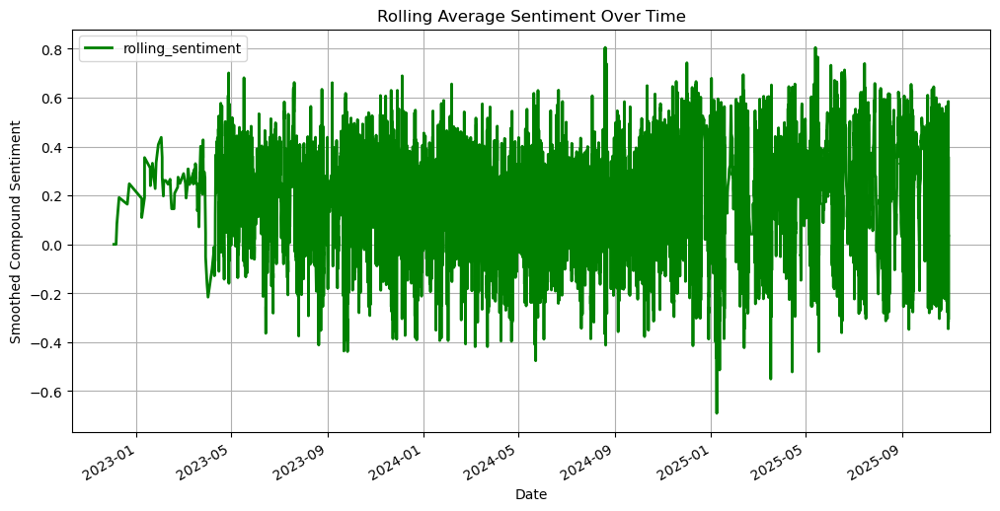

In [19]:
job_df_sorted = job_df.sort_values('date')

job_df_sorted['rolling_sentiment'] = (
    job_df_sorted['compound']
    .rolling(window=10, min_periods=1)
    .mean()
)

job_df_sorted.plot(
    x='date', 
    y='rolling_sentiment',
    figsize=(12,6),
    linewidth=2,
    color='green'
)

plt.title("Rolling Average Sentiment Over Time")
plt.ylabel("Smoothed Compound Sentiment")
plt.xlabel("Date")
plt.grid(True)
plt.show()


In [20]:
import pandas as pd
import re

# 1. School-related keywords
school_keywords = [
    "school", "college", "university", "uni", "campus", "class",
    "homework", "study", "studying", "assignment", "teacher",
    "professor", "exam", "test", "lecture", "semester", "tuition",
    "education", "degree", "students", "student", "classroom"
]

# 2. Build regex pattern (whole-word match)
pattern = r"\b(" + "|".join(school_keywords) + r")\b"

# 3. Filter dataframe (case-insensitive)
school_df = df[df["cleaned_text"].str.contains(pattern, case=False, na=False, regex=True)]

# 4. Reset index
school_df = school_df.reset_index(drop=True)

# 5. Preview
print(f"Number of school-related posts: {len(school_df)}")
school_df.head(10)


Number of school-related posts: 28830


,keyword,author,text,created_at,uri,like_count,repost_count,reply_count,author_display_name,has_embedded_media,cleaned_text
0,chatgpt,andrewdessler.com,I think it will depend on the class. Next tim...,2024-11-02T21:39:36.602Z,at://did:plc:uyemf6niinxjzirk7pbzzt3j/app.bsky...,0,0,0,Andrew Dessler,False,I think it will depend on the class. Next tim...
1,chatgpt,vincewall.bsky.social,"A ""more streamlined"" version of #ChatGPT ""is j...",2024-11-20T03:19:30.082Z,at://did:plc:eq6rkkatcc3xyul5jyjaufsp/app.bsky...,1,0,0,Vince Wall 💬,False,"A ""more streamlined"" version of #ChatGPT ""is j..."
2,chatgpt,jorgeorchilles.bsky.social,ChatGPT for Offensive Security video followed ...,2024-11-24T07:11:01.950Z,at://did:plc:qfuha4d2jzek2jhmemjkiui6/app.bsky...,0,0,1,Jorge Orchilles,False,ChatGPT for Offensive Security video followed ...
3,chatgpt,joelhooks.com,"eventually we'll be able to prompt ChatGPT ""pl...",2024-11-04T16:45:00.084Z,at://did:plc:urqqcsulsrxjf2mwy6qauxuu/app.bsky...,0,0,0,joel 🌦️,False,"eventually we'll be able to prompt ChatGPT ""pl..."
4,chatgpt,sharp.blue,ChatGPT might not pass the Turing Test but it ...,2024-11-13T00:18:07.114Z,at://did:plc:dtl7jeyiscsbqmkmcsv7457b/app.bsky...,0,0,0,Richard Baker,False,ChatGPT might not pass the Turing Test but it ...
5,chatgpt,enfascination.com,Another things that's remarkable about ChatGPT...,2024-11-15T20:08:16.855Z,at://did:plc:spyqczb7qyhjnfoygskllm3m/app.bsky...,0,0,0,Seth Frey,False,Another things that's remarkable about ChatGPT...
6,ai,hnbot.bsky.social,AI breakthrough ChatGPT raises alarm over stud...,2022-12-19T08:06:29.822Z,at://did:plc:fjsmdevv3mmzc3dpd36u5yxc/app.bsky...,0,0,0,NaN,False,AI breakthrough ChatGPT raises alarm over stud...
7,chatgpt,markkamstra.com,ChatGPT may change everything more than fusion...,2024-11-23T06:21:36.468Z,at://did:plc:qlbb34cfv4zuww2tsiqgckgz/app.bsky...,0,0,0,Mark Kamstra,False,ChatGPT may change everything more than fusion...
8,chatgpt,hipstersmoothie.com,Schools blocking ChatGpt is like the time I go...,2024-11-04T00:49:59.986Z,at://did:plc:m2sjv3wncvsasdapla35hzwj/app.bsky...,0,0,0,Andrew Lisowski 💻,False,Schools blocking ChatGpt is like the time I go...
9,chatgpt,sugaroverflow.com,.@john_cogs and I put #ChatGPT to the test to ...,2024-11-03T18:58:07.498Z,at://did:plc:ao5earijf55kklupgr6e4nyy/app.bsky...,0,0,1,sugaroverflow 🌸,False,.john_cogs and I put #ChatGPT to the test to s...


In [21]:
# --- Step 0: Imports ---
import pandas as pd
from nltk.sentiment import SentimentIntensityAnalyzer
import nltk
import matplotlib.pyplot as plt

# Download required resources
nltk.download('vader_lexicon')

# --- Step 1: Initialize VADER ---
sia = SentimentIntensityAnalyzer()

# --- Step 2: Sentiment analysis on school_df ---
# Use cleaned_text
school_df['sentiment_scores'] = school_df['cleaned_text'].apply(lambda x: sia.polarity_scores(str(x)))

# Extract compound score
school_df['compound'] = school_df['sentiment_scores'].apply(lambda x: x['compound'])

# --- Step 3: Assign sentiment labels ---
def get_label(score):
    if score >= 0.05:
        return 'positive'
    elif score <= -0.05:
        return 'negative'
    else:
        return 'neutral'

school_df['sentiment_label'] = school_df['compound'].apply(get_label)

# --- Step 4: Count sentiment categories ---
sentiment_counts = school_df['sentiment_label'].value_counts()
print("Sentiment Counts:\n", sentiment_counts)

# --- Step 5: Inspect results ---
school_df[['cleaned_text', 'compound', 'sentiment_label']].head(10)


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/isabellalatchamradusky/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


Sentiment Counts:
 sentiment_label
positive    14880
negative     7801
neutral      6149
Name: count, dtype: int64


,cleaned_text,compound,sentiment_label
0,I think it will depend on the class. Next tim...,0.6597,positive
1,"A ""more streamlined"" version of #ChatGPT ""is j...",0.0000,neutral
2,ChatGPT for Offensive Security video followed ...,0.5531,positive
3,"eventually we'll be able to prompt ChatGPT ""pl...",0.8221,positive
4,ChatGPT might not pass the Turing Test but it ...,0.4767,positive
5,Another things that's remarkable about ChatGPT...,-0.2732,negative
6,AI breakthrough ChatGPT raises alarm over stud...,-0.7184,negative
7,ChatGPT may change everything more than fusion...,0.1027,positive
8,Schools blocking ChatGpt is like the time I go...,-0.0516,negative
9,.john_cogs and I put #ChatGPT to the test to s...,0.0000,neutral


In [22]:
# --- Descriptive statistics for sentiment ---
desc_stats = school_df['compound'].describe()
print("Descriptive Statistics for Compound Sentiment:\n")
print(desc_stats)

# Optional: include sentiment counts
sentiment_counts = school_df['sentiment_label'].value_counts()
print("\nSentiment Label Counts:\n")
print(sentiment_counts)

# Optional: percentages of each sentiment
sentiment_percent = school_df['sentiment_label'].value_counts(normalize=True) * 100
print("\nSentiment Label Percentages:\n")
print(sentiment_percent)


Descriptive Statistics for Compound Sentiment:

count    28830.000000
mean         0.146126
std          0.477563
min         -0.983400
25%         -0.128000
50%          0.102700
75%          0.534600
max          0.982800
Name: compound, dtype: float64

Sentiment Label Counts:

sentiment_label
positive    14880
negative     7801
neutral      6149
Name: count, dtype: int64

Sentiment Label Percentages:

sentiment_label
positive    51.612903
negative    27.058619
neutral     21.328477
Name: proportion, dtype: float64


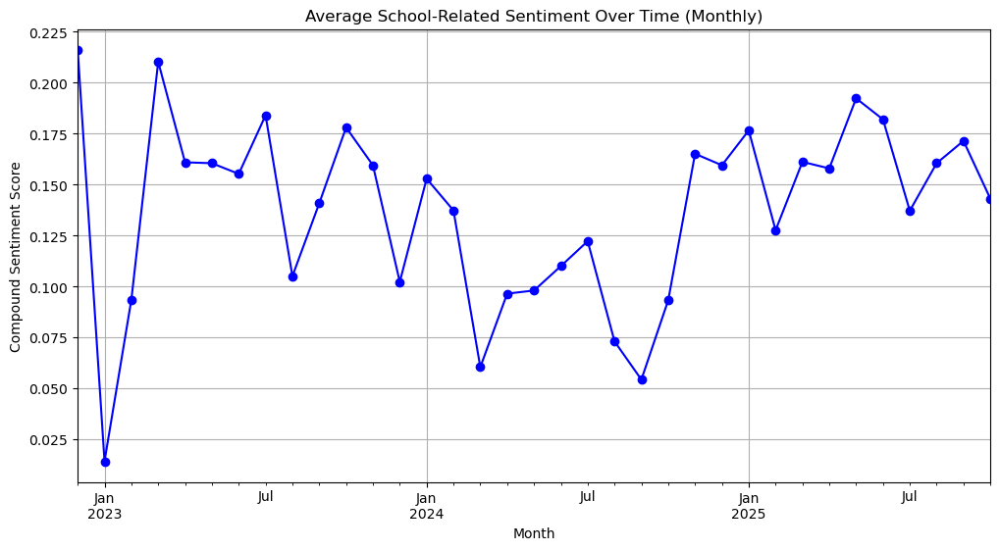

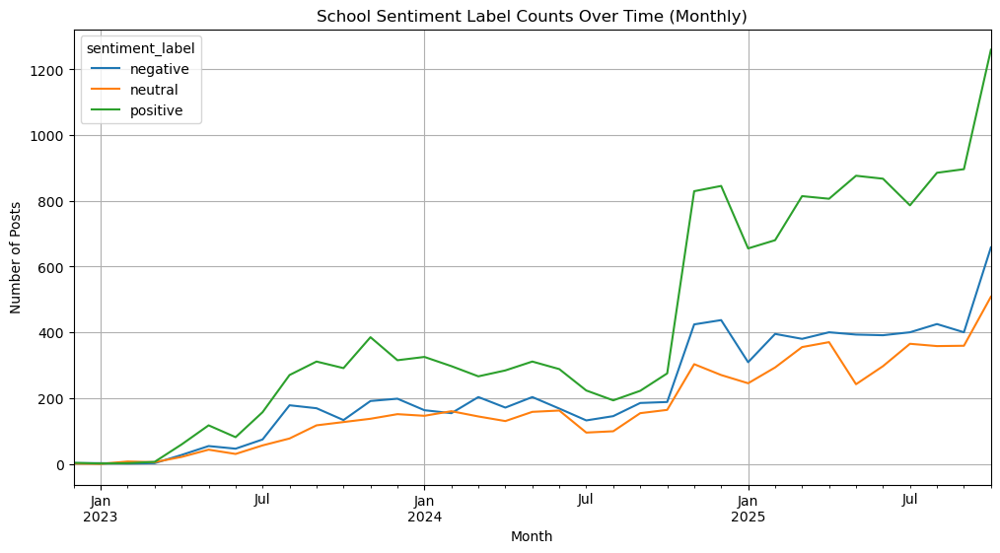

In [23]:
import matplotlib.pyplot as plt
import pandas as pd

# Ensure 'created_at' is datetime
school_df['date'] = pd.to_datetime(school_df['created_at'], errors='coerce')

# Filter date range Nov 2022 → Nov 2025
start_date = "2022-11-01"
end_date   = "2025-11-30"

filtered_df = school_df[
    (school_df['date'] >= start_date) &
    (school_df['date'] <= end_date)
]

# Group by month and compute average compound sentiment
sentiment_over_time = filtered_df.groupby(filtered_df['date'].dt.to_period('M'))['compound'].mean()

# Plot average sentiment over time
plt.figure(figsize=(12,6))
sentiment_over_time.plot(kind='line', marker='o', color='blue')
plt.title("Average School-Related Sentiment Over Time (Monthly)")
plt.ylabel("Compound Sentiment Score")
plt.xlabel("Month")
plt.grid(True)
plt.show()

# Optional: Count of sentiment labels over time
sentiment_labels_over_time = filtered_df.groupby([
    filtered_df['date'].dt.to_period('M'),
    'sentiment_label'
]).size().unstack(fill_value=0)

sentiment_labels_over_time.plot(kind='line', figsize=(12,6))
plt.title("School Sentiment Label Counts Over Time (Monthly)")
plt.ylabel("Number of Posts")
plt.xlabel("Month")
plt.grid(True)
plt.show()


Descriptive Statistics for Positive School Posts:

count    14880.000000
mean         0.531382
std          0.231414
min          0.051600
25%          0.361200
50%          0.520100
75%          0.726900
max          0.982800
Name: compound, dtype: float64


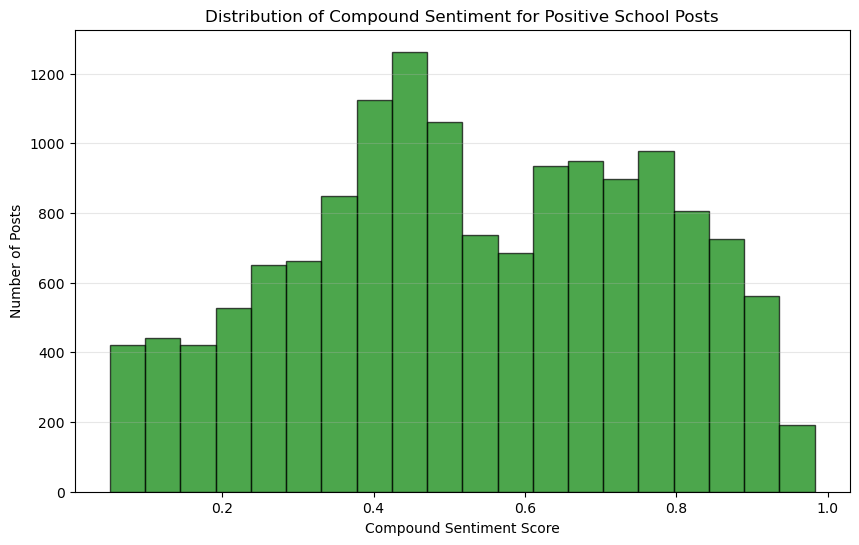

In [24]:
import matplotlib.pyplot as plt

# Filter only positive posts
positive_df = school_df[school_df['sentiment_label'] == 'positive']

# Descriptive statistics for positive posts
pos_desc_stats = positive_df['compound'].describe()
print("Descriptive Statistics for Positive School Posts:\n")
print(pos_desc_stats)

# Plot distribution (histogram)
plt.figure(figsize=(10,6))
plt.hist(positive_df['compound'], bins=20, color='green', edgecolor='black', alpha=0.7)
plt.title("Distribution of Compound Sentiment for Positive School Posts")
plt.xlabel("Compound Sentiment Score")
plt.ylabel("Number of Posts")
plt.grid(axis='y', alpha=0.3)
plt.show()


Descriptive Statistics for Negative School Posts:

count    7801.000000
mean       -0.473779
std         0.237697
min        -0.983400
25%        -0.659700
50%        -0.476700
75%        -0.296000
max        -0.050400
Name: compound, dtype: float64


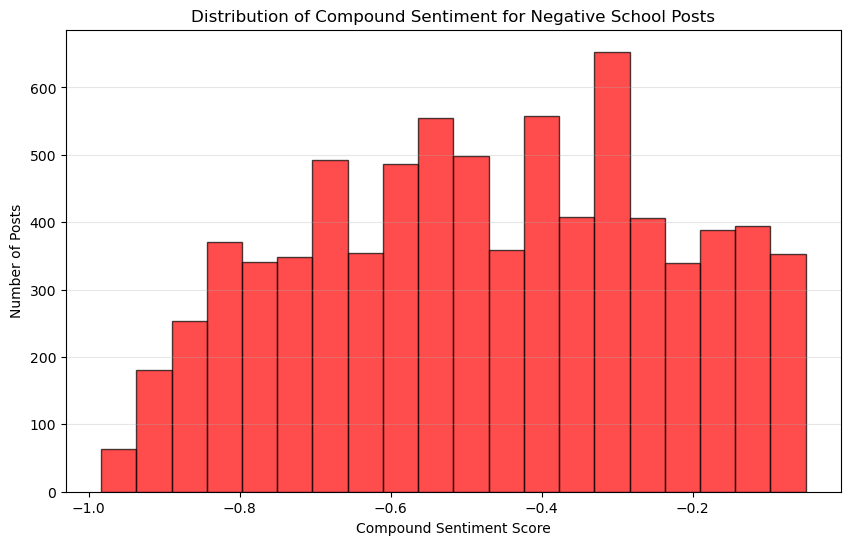

In [25]:
import matplotlib.pyplot as plt

# Filter only negative posts
negative_df = school_df[school_df['sentiment_label'] == 'negative']

# Descriptive statistics for negative posts
neg_desc_stats = negative_df['compound'].describe()
print("Descriptive Statistics for Negative School Posts:\n")
print(neg_desc_stats)

# Plot distribution (histogram)
plt.figure(figsize=(10,6))
plt.hist(negative_df['compound'], bins=20, color='red', edgecolor='black', alpha=0.7)
plt.title("Distribution of Compound Sentiment for Negative School Posts")
plt.xlabel("Compound Sentiment Score")
plt.ylabel("Number of Posts")
plt.grid(axis='y', alpha=0.3)
plt.show()


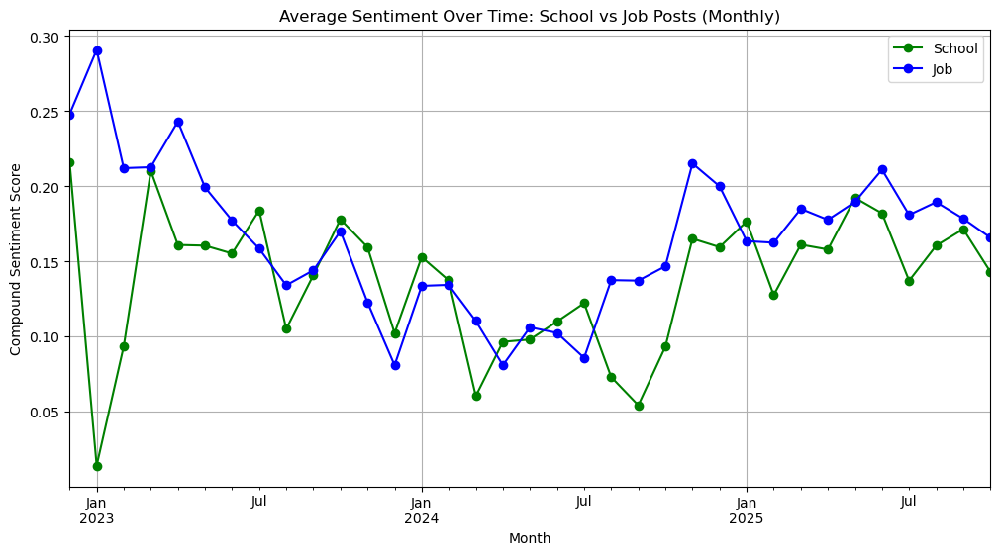

<Figure size 1200x600 with 0 Axes>

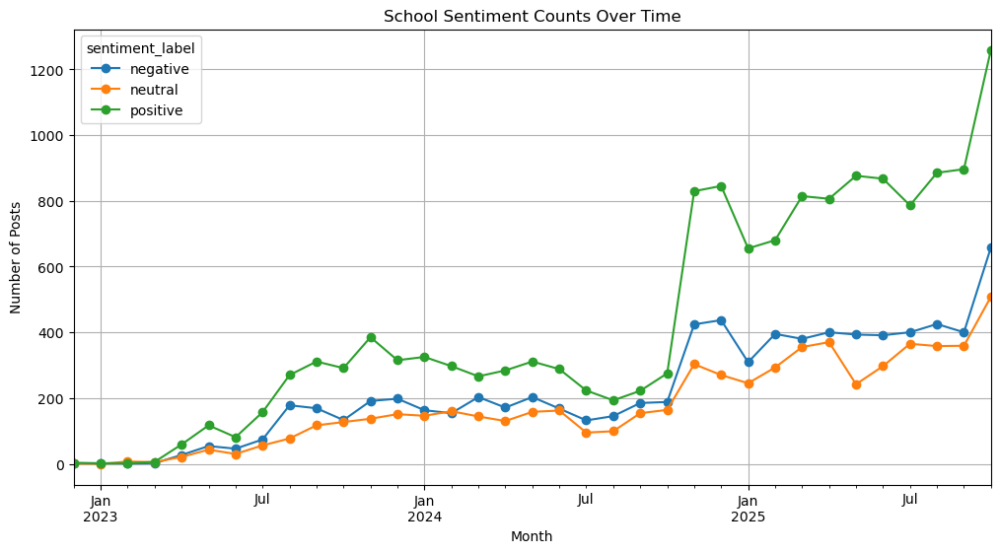

<Figure size 1200x600 with 0 Axes>

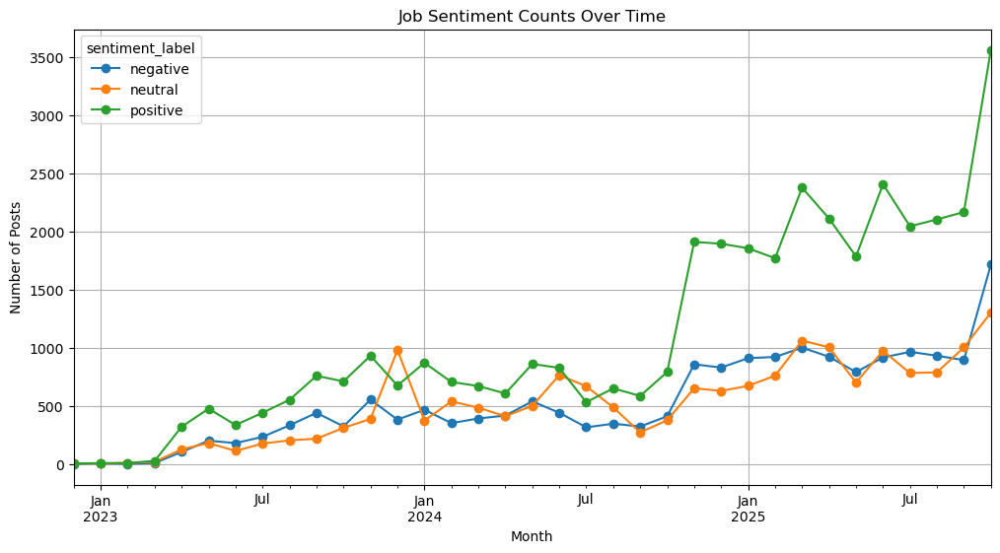

In [26]:
import pandas as pd
import matplotlib.pyplot as plt

# --- Ensure datetime for both dataframes ---
school_df['date'] = pd.to_datetime(school_df['created_at'], errors='coerce')
job_df['date'] = pd.to_datetime(job_df['created_at'], errors='coerce')

# --- Filter date range (Nov 2022 to Nov 2025) ---
start_date = "2022-11-01"
end_date   = "2025-11-30"

school_filtered = school_df[(school_df['date'] >= start_date) & (school_df['date'] <= end_date)]
job_filtered    = job_df[(job_df['date'] >= start_date) & (job_df['date'] <= end_date)]

# --- Group by month and calculate average sentiment ---
school_sentiment = school_filtered.groupby(school_filtered['date'].dt.to_period('M'))['compound'].mean()
job_sentiment    = job_filtered.groupby(job_filtered['date'].dt.to_period('M'))['compound'].mean()

# --- Plot average sentiment over time for both ---
plt.figure(figsize=(12,6))
school_sentiment.plot(marker='o', color='green', label='School')
job_sentiment.plot(marker='o', color='blue', label='Job')
plt.title("Average Sentiment Over Time: School vs Job Posts (Monthly)")
plt.ylabel("Compound Sentiment Score")
plt.xlabel("Month")
plt.legend()
plt.grid(True)
plt.show()

# --- Optional: Count positive/neutral/negative posts per month for comparison ---
school_counts = school_filtered.groupby([school_filtered['date'].dt.to_period('M'), 'sentiment_label']).size().unstack(fill_value=0)
job_counts    = job_filtered.groupby([job_filtered['date'].dt.to_period('M'), 'sentiment_label']).size().unstack(fill_value=0)

plt.figure(figsize=(12,6))
school_counts.plot(marker='o', figsize=(12,6), title="School Sentiment Counts Over Time")
plt.ylabel("Number of Posts")
plt.xlabel("Month")
plt.grid(True)
plt.show()

plt.figure(figsize=(12,6))
job_counts.plot(marker='o', figsize=(12,6), title="Job Sentiment Counts Over Time")
plt.ylabel("Number of Posts")
plt.xlabel("Month")
plt.grid(True)
plt.show()


In [27]:
from sklearn.feature_extraction.text import CountVectorizer

def top_ngrams(df, ngram_range=(1,2), top_n=20):
    vectorizer = CountVectorizer(stop_words='english', ngram_range=ngram_range)
    X = vectorizer.fit_transform(df['cleaned_text'].astype(str))
    counts = X.sum(axis=0)
    terms = vectorizer.get_feature_names_out()
    top_terms = sorted(zip(terms, counts.tolist()[0]), key=lambda x: x[1], reverse=True)
    return top_terms[:top_n]

# Example: top bigrams in school posts
top_ngrams(school_df, ngram_range=(2,2))


[('using chatgpt', 817),
 ('use chatgpt', 788),
 ('bsky social', 736),
 ('generative ai', 551),
 ('use ai', 548),
 ('artificial intelligence', 517),
 ('large language', 464),
 ('high school', 451),
 ('using ai', 431),
 ('language models', 407),
 ('new ai', 405),
 ('ai tools', 404),
 ('google gemini', 404),
 ('match feed', 390),
 ('ai education', 388),
 ('new study', 381),
 ('students use', 377),
 ('like chatgpt', 364),
 ('origin match', 357),
 ('free test', 336)]

In [28]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import NMF

def get_topics(df, n_topics=3, n_top_words=10):
    tfidf = TfidfVectorizer(stop_words='english')
    X = tfidf.fit_transform(df['cleaned_text'].astype(str))
    nmf = NMF(n_components=n_topics, random_state=42)
    nmf.fit(X)
    feature_names = tfidf.get_feature_names_out()
    topics = []
    for topic_idx, topic in enumerate(nmf.components_):
        top_words = [feature_names[i] for i in topic.argsort()[-n_top_words:]]
        topics.append((topic_idx+1, top_words))
    return topics

get_topics(job_df, n_topics=3)


[(1,
  ['people',
   'job',
   'use',
   'just',
   'like',
   'openai',
   'llm',
   'chatgpt',
   'work',
   'ai']),
 (2,
  ['continues',
   'ios',
   'siri',
   'ai',
   'work',
   'generative',
   'podcast',
   'fleet',
   '9to5mac',
   'apple']),
 (3,
  ['synthart',
   'aiartcommunity',
   'aiイラスト',
   'aiartcommuity',
   'ａｉイラスト',
   'aiart',
   'ai画像',
   'aiartists',
   'digitalart',
   'aiartwork'])]

In [29]:
import spacy
nlp = spacy.load("en_core_web_sm")

def extract_aspects(text, keywords):
    doc = nlp(text)
    aspects = []
    for token in doc:
        if token.lemma_.lower() in keywords:
            for child in token.children:
                if child.dep_ in ["amod","acomp","advmod"]:
                    aspects.append((token.text, child.text))
    return aspects

keywords = ["salary","manager","coworkers","professor","teacher","exam"]
job_df['aspects'] = job_df['cleaned_text'].apply(lambda x: extract_aspects(str(x), keywords))


In [30]:
# Only show posts where aspects were actually found
non_empty_aspects = job_df[job_df['aspects'].str.len() > 0]
print(non_empty_aspects[['cleaned_text', 'aspects']].head(10))

                                           cleaned_text  \
76    Fusty pundits scurry on ChatGPT alternatives e...   
464   "ChatGPT is going to put social media managers...   
553   Notes from working with chatGPT to make a Java...   
873   I'm hereby available to any interested company...   
1139  natashanyt: Dear teachers on Twitter: \nWe're ...   
1385  It’s even more fraught when folks include anec...   
1625  Now a month into my job, I can say ChatGPT hel...   
1727  I created “custom instructions” for ChatGPT 4....   
1734  The law students were  plagiarizing their home...   
1896  For Simpson's Paradox, data on avg test scores...   

                                                aspects  
76                                      [(exams, oral)]  
464          [(managers, social), (manager, artisanal)]  
553                                  [(manager, pissy)]  
873               [(salary, double), (salary, current)]  
1139                                 [(teachers, Dear)]  
13

In [31]:
# Print each post with aspects line by line
for idx, row in job_df.iterrows():
    if row['aspects']:  # only if aspects exist
        print(f"Post {idx}: {row['cleaned_text']}")
        for aspect, modifier in row['aspects']:
            print(f"  - {aspect}: {modifier}")
        print("-"*50)


Post 76: Fusty pundits scurry on ChatGPT alternatives e.g. some think oral exams only exist in HE vivas.
No. Millions delivered for Eng language, medicine, EU civil service recruitment, French Baccalauréat Général. 
Beware of narrow, dogmatic, parochial views - it's a big world out there.
  - exams: oral
--------------------------------------------------
Post 464: "ChatGPT is going to put social media managers out of work." Nah fam, I'm rebranding myself as an "artisanal" social media manager and tripling my rates. These are homegrown, farm to Twitter, certified organic memes.
  - managers: social
  - manager: artisanal
--------------------------------------------------
Post 553: Notes from working with chatGPT to make a JavaScript game. It has turned me into a pissy dev manager, who asks for the code to be rewritten all the time. That is what I have become, but chatGPT 4 is a very mercurial type of dev. sometimes brilliant, often forgetful.
  - manager: pissy
-------------------------

In [32]:
import spacy
nlp = spacy.load("en_core_web_sm")

def extract_aspects(text, keywords):
    doc = nlp(text)
    aspects = []
    for token in doc:
        if token.lemma_.lower() in keywords:
            for child in token.children:
                if child.dep_ in ["amod","acomp","advmod"]:
                    aspects.append((token.text, child.text))
    return aspects

keywords = ["salary","manager","coworkers","work","boss"]
job_df['aspects'] = job_df['cleaned_text'].apply(lambda x: extract_aspects(str(x), keywords))


In [33]:
# Print each post with aspects line by line
for idx, row in job_df.iterrows():
    if row['aspects']:  # only if aspects exist
        print(f"Post {idx}: {row['cleaned_text']}")
        for aspect, modifier in row['aspects']:
            print(f"  - {aspect}: {modifier}")
        print("-"*50)


Post 1: ChatGPT for Offensive Security video followed by David Hoelzer explaining how it all works 

If you want to learn more, I highly encourage you to taking his class SEC595: 
  - works: how
--------------------------------------------------
Post 2: "been having a blast with ChatGPT. In the past week I've written website copy (and many) emails, wrote legal templates, updated our board charters, wrote funny songs for (kids), and created the first draft of a new company policy. This is going to (quickly) transform work"
  - work: quickly
--------------------------------------------------
Post 3: This tweet thread brought to you by #ChatGPT and the prompt, "Create a twitter thread about social work and technology"
#SWTech #SWFutures

  - work: social
--------------------------------------------------
Post 7: In 1 day, ChatGPT has quickly become my buddy to ask profound questions and marvel at the response! How freaking apt and insanely accurate it is on fuzzy responses!!!! As ML pract

In [34]:
import spacy
nlp = spacy.load("en_core_web_sm")

def extract_aspects(text, keywords):
    doc = nlp(text)
    aspects = []
    for token in doc:
        if token.lemma_.lower() in keywords:
            for child in token.children:
                if child.dep_ in ["amod","acomp","advmod"]:
                    aspects.append((token.text, child.text))
    return aspects

keywords = ["teaccher","professor","exam","homework","assignment"]
school_df['aspects'] = school_df['cleaned_text'].apply(lambda x: extract_aspects(str(x), keywords))

In [35]:
# Print each post with aspects line by line
for idx, row in school_df.iterrows():
    if row['aspects']:  # only if aspects exist
        print(f"Post {idx}: {row['cleaned_text']}")
        for aspect, modifier in row['aspects']:
            print(f"  - {aspect}: {modifier}")
        print("-"*50)

Post 69: ICYMI: Sure, it can pass a medical licensing exam. But does it know the fastest way to slow climate change is to slash methane emissions? We asked ChatGPT about climate change and found out it’s still got some machine learning to do. 

  - exam: medical
--------------------------------------------------
Post 78: Sure, it can pass a medical licensing exam. But does it know the fastest way to slow climate change is to slash methane emissions? We asked ChatGPT about climate change and found out it’s still got some machine learning to do. 

  - exam: medical
--------------------------------------------------
Post 86: Sure, it can pass a medical licensing exam. But does it know the fastest way to slow climate change is to slash methane emissions? We asked ChatGPT about climate change and found out it’s still got some machine learning to do. 

  - exam: medical
--------------------------------------------------
Post 249: The newest version of ChatGPT passed the US medical licensing 

In [36]:
for idx, row in school_df.iterrows():
    if row['aspects']:
        # check if any modifier contains "stress" (so "stressful", "stressed", etc.)
        if any("stress" in modifier.lower() for aspect, modifier in row['aspects']):
            print(f"Post {idx}: {row['cleaned_text']}")
            for aspect, modifier in row['aspects']:
                print(f"  - {aspect}: {modifier}")
            print("-"*50)


4. Sentiment Over Time / Trend Analysis

You can plot sentiment by month to see if feelings about jobs or school are improving or worsening over time. You’ve done this already, but you can combine it with volume:

Average sentiment per month

Count of positive/neutral/negative posts per month

Overlay keywords that appear in spikes

5. Word Clouds / Visualization

Word clouds for positive posts → what people like

Word clouds for negative posts → what people dislike

Compare job vs school side by side

6. Strongest Posts

Take top 10–20 most positive or most negative posts (compound score)

Inspect manually to get qualitative insights

Often the strongest posts reveal key pain points or highlights

7. Emotion Analysis

Sentiment is broad (pos/neg/neutral), but emotion analysis can reveal if people are joyful, anxious, trusting, stressed, etc.

Use NRCLex (if installable)

Or manual word lists for emotions

8. Clustering / Grouping

Cluster posts with KMeans or Agglomerative Clustering on TF-IDF vectors

Each cluster represents a common theme or opinion

Then inspect top words per cluster

9. Compare Job vs School

Side-by-side analysis of:

Most common positive words

Most common negative words

Top themes/topics

Sentiment trends over time

Gives a clear picture of how opinions differ between the two domains

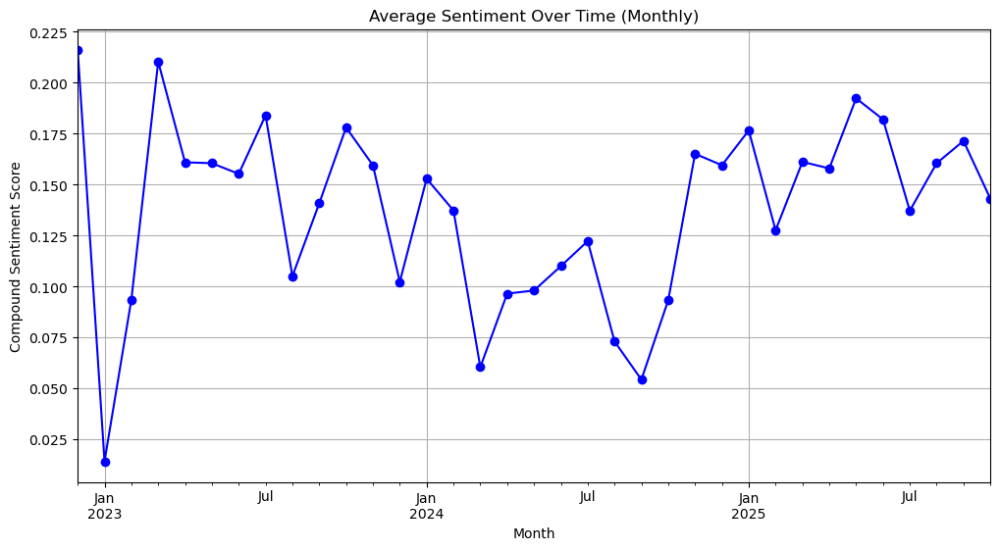

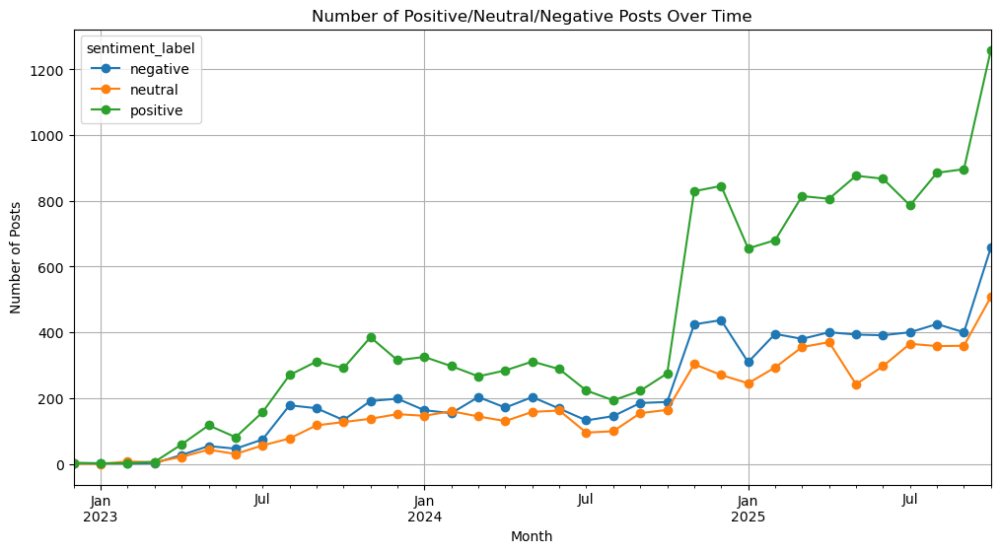

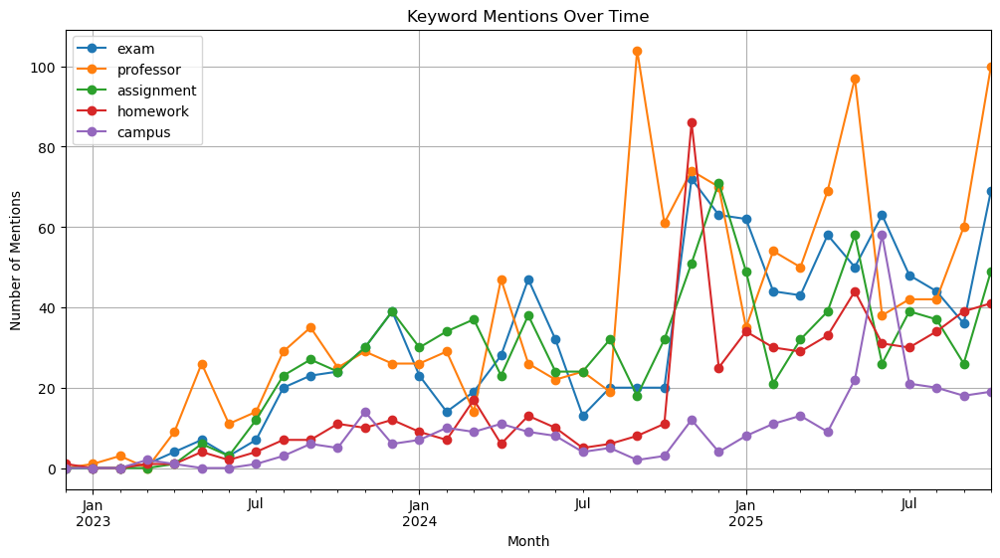

In [37]:
import pandas as pd
import matplotlib.pyplot as plt

# --- Ensure datetime ---
school_df['date'] = pd.to_datetime(school_df['created_at'], errors='coerce')

# --- Filter date range (Nov 2022 to Nov 2025) ---
start_date = "2022-11-01"
end_date   = "2025-11-30"

filtered_df = school_df[
    (school_df['date'] >= start_date) &
    (school_df['date'] <= end_date)
]

# --- Group by month ---
monthly_sentiment = filtered_df.groupby(filtered_df['date'].dt.to_period('M'))['compound'].mean()

monthly_counts = filtered_df.groupby([filtered_df['date'].dt.to_period('M'), 'sentiment_label']).size().unstack(fill_value=0)

# --- Plot average sentiment over time ---
plt.figure(figsize=(12,6))
monthly_sentiment.plot(marker='o', color='blue')
plt.title("Average Sentiment Over Time (Monthly)")
plt.ylabel("Compound Sentiment Score")
plt.xlabel("Month")
plt.grid(True)
plt.show()

# --- Plot counts of sentiment labels over time ---
monthly_counts.plot(kind='line', figsize=(12,6), marker='o')
plt.title("Number of Positive/Neutral/Negative Posts Over Time")
plt.ylabel("Number of Posts")
plt.xlabel("Month")
plt.grid(True)
plt.show()

# --- Optional: Overlay keywords in spikes ---
# Define keywords to check
keywords = ["exam", "professor", "assignment", "homework", "campus"]

# Count keyword occurrences per month
def count_keyword_occurrences(df, keyword):
    return df['cleaned_text'].str.contains(keyword, case=False, na=False).groupby(df['date'].dt.to_period('M')).sum()

keyword_counts = pd.DataFrame({kw: count_keyword_occurrences(filtered_df, kw) for kw in keywords})

# Plot keyword trends
keyword_counts.plot(figsize=(12,6), marker='o')
plt.title("Keyword Mentions Over Time")
plt.ylabel("Number of Mentions")
plt.xlabel("Month")
plt.grid(True)
plt.show()


Number of college-related posts: 9674


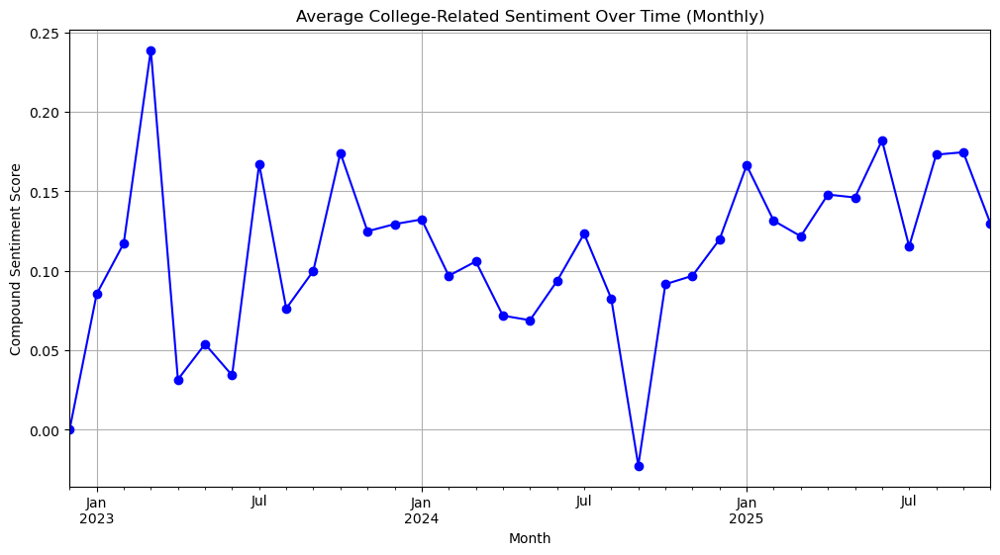

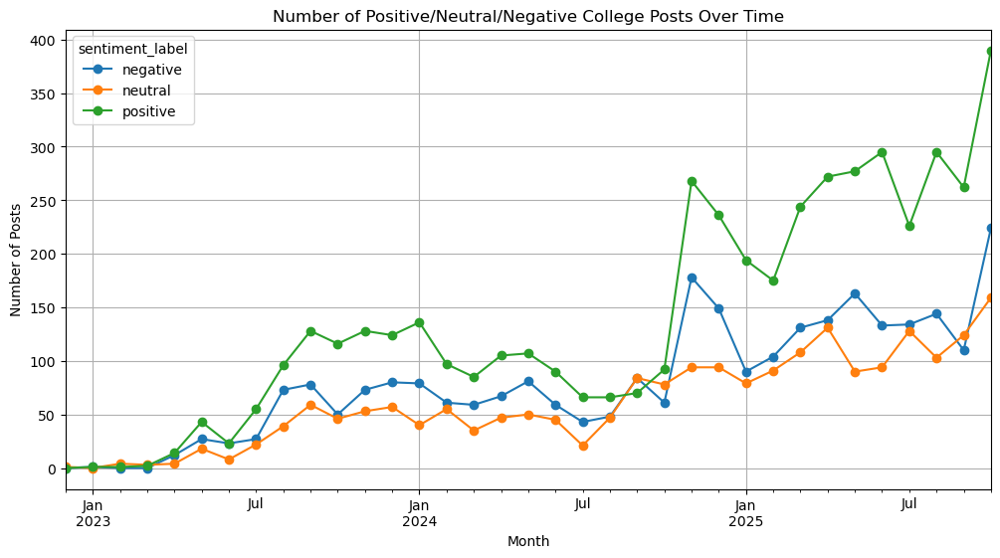

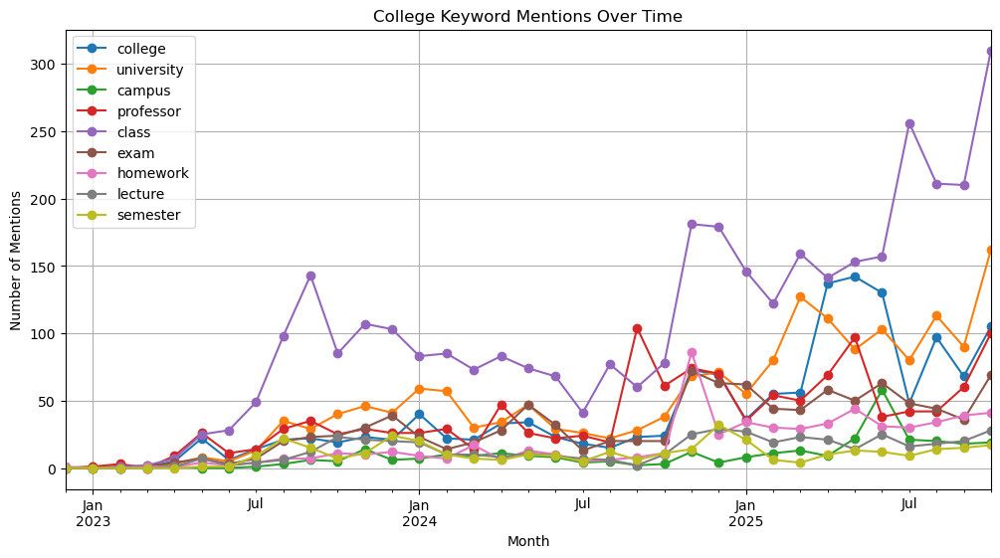

In [38]:
import pandas as pd
import matplotlib.pyplot as plt

# --- Define college-related keywords ---
college_keywords = ["college", "university", "campus", "professor", "class", "exam", "homework", "lecture", "semester"]

# --- Filter posts containing any college keywords ---
college_df = school_df[school_df['cleaned_text'].str.contains("|".join(college_keywords), case=False, na=False)].copy()
college_df.reset_index(drop=True, inplace=True)

print(f"Number of college-related posts: {len(college_df)}")

# --- Ensure datetime ---
college_df['date'] = pd.to_datetime(college_df['created_at'], errors='coerce')

# --- Filter date range (Nov 2022 to Nov 2025) ---
start_date = "2022-11-01"
end_date   = "2025-11-30"
college_df = college_df[(college_df['date'] >= start_date) & (college_df['date'] <= end_date)]

# --- Group by month ---
monthly_sentiment = college_df.groupby(college_df['date'].dt.to_period('M'))['compound'].mean()
monthly_counts = college_df.groupby([college_df['date'].dt.to_period('M'), 'sentiment_label']).size().unstack(fill_value=0)

# --- Plot average sentiment over time ---
plt.figure(figsize=(12,6))
monthly_sentiment.plot(marker='o', color='blue')
plt.title("Average College-Related Sentiment Over Time (Monthly)")
plt.ylabel("Compound Sentiment Score")
plt.xlabel("Month")
plt.grid(True)
plt.show()

# --- Plot counts of sentiment labels over time ---
monthly_counts.plot(kind='line', figsize=(12,6), marker='o')
plt.title("Number of Positive/Neutral/Negative College Posts Over Time")
plt.ylabel("Number of Posts")
plt.xlabel("Month")
plt.grid(True)
plt.show()

# --- Optional: Keyword trends ---
# Count keyword occurrences per month
def count_keyword_occurrences(df, keyword):
    return df['cleaned_text'].str.contains(keyword, case=False, na=False).groupby(df['date'].dt.to_period('M')).sum()

keyword_counts = pd.DataFrame({kw: count_keyword_occurrences(college_df, kw) for kw in college_keywords})

# Plot keyword trends
keyword_counts.plot(figsize=(12,6), marker='o')
plt.title("College Keyword Mentions Over Time")
plt.ylabel("Number of Mentions")
plt.xlabel("Month")
plt.grid(True)
plt.show()


In [39]:
# --- Top positive posts ---

top_positive_school = school_df.nlargest(10, 'compound')[['cleaned_text', 'compound', 'sentiment_label']]
top_positive_job    = job_df.nlargest(10, 'compound')[['cleaned_text', 'compound', 'sentiment_label']]

print("=== Top 10 Positive School Posts ===")
for idx, row in top_positive_school.iterrows():
    print(f"Post {idx} (Score: {row['compound']}): {row['cleaned_text']}")
    print("-"*80)

print("\n=== Top 10 Positive Job Posts ===")
for idx, row in top_positive_job.iterrows():
    print(f"Post {idx} (Score: {row['compound']}): {row['cleaned_text']}")
    print("-"*80)


# --- Top negative posts ---

top_negative_school = school_df.nsmallest(10, 'compound')[['cleaned_text', 'compound', 'sentiment_label']]
top_negative_job    = job_df.nsmallest(10, 'compound')[['cleaned_text', 'compound', 'sentiment_label']]

print("\n=== Top 10 Negative School Posts ===")
for idx, row in top_negative_school.iterrows():
    print(f"Post {idx} (Score: {row['compound']}): {row['cleaned_text']}")
    print("-"*80)

print("\n=== Top 10 Negative Job Posts ===")
for idx, row in top_negative_job.iterrows():
    print(f"Post {idx} (Score: {row['compound']}): {row['cleaned_text']}")
    print("-"*80)


=== Top 10 Positive School Posts ===
Post 27489 (Score: 0.9828): Ah but the very best to you! I trust it was a pleasant one? I'm actually a June baby (you'll never meet a more Gemini Gemini) but September and the Back to School of it is a time I absolutely love for a reboot so I think I definitely bring those vibes on these days.
--------------------------------------------------------------------------------
Post 9408 (Score: 0.9821): Ok, many have DM me and asked what makes me 80% more productive.

Here's a list of 6 top tools I use:

ChatGPT — FREE (Research)
Canva — FREE (Design)
Gumroad — FREE (Product)
Notion — FREE (Management & Writing)
Threads — FREE (Marketing)
Facebook — FREE (Marketing)

Case Study:...
--------------------------------------------------------------------------------
Post 28176 (Score: 0.9817): I would have thought so but alignment is central to successful reward shaping, and DeepSeek are reteaching the world the importance of rewards/RL in both training&test

In [40]:
# Drop rows with missing compound scores
school_df_clean = school_df.dropna(subset=['compound'])
job_df_clean    = job_df.dropna(subset=['compound'])

# Top 10 positive and negative posts
top_positive_school = school_df_clean.nlargest(10, 'compound')[['cleaned_text', 'compound']]
top_negative_school = school_df_clean.nsmallest(10, 'compound')[['cleaned_text', 'compound']]

top_positive_job = job_df_clean.nlargest(10, 'compound')[['cleaned_text', 'compound']]
top_negative_job = job_df_clean.nsmallest(10, 'compound')[['cleaned_text', 'compound']]

print("Top Positive School Posts:\n", top_positive_school)
print("\nTop Negative School Posts:\n", top_negative_school)
print("\nTop Positive Job Posts:\n", top_positive_job)
print("\nTop Negative Job Posts:\n", top_negative_job)


Top Positive School Posts:
                                             cleaned_text  compound
27489  Ah but the very best to you! I trust it was a ...    0.9828
9408   Ok, many have DM me and asked what makes me 80...    0.9821
28176  I would have thought so but alignment is centr...    0.9817
24478  Truer words. \n\nMostly I think students [my a...    0.9796
5611   I really want my new college students to write...    0.9776
439    I'm doing plenty of exciting ChatGPT experimen...    0.9746
14088  Yep. AI was my specialisation in college. And ...    0.9738
19666  SO MANY GOOD IDEAS!\n\nTeachers are so overwor...    0.9725
2802   I think best practice among grad students thes...    0.9708
8210   Definition of a Father according to #ChatGPT:\...    0.9701

Top Negative School Posts:
                                             cleaned_text  compound
24925  But because you lied, you cheated, you disresp...   -0.9834
17789  man\n\nif you give a LLM or whatever\n\na rand...   -0.9792
24953

In [41]:
print("\nTop Positive Job Posts:\n", top_positive_job)
print("\nTop Negative Job Posts:\n", top_negative_job)


Top Positive Job Posts:
                                             cleaned_text  compound
67229  :dizzy: NOVEMBER 2024 :sparkles:\n\n#Aries: At...    0.9916
70505  JULY 14-JULY 30\nAries: Massive Money Boost\nT...    0.9913
71084  AUG 7-NOV 7\nAries: Massive Money Boost\nTauru...    0.9913
71201  AUG 5-NOV 7\nAries: Massive Money Boost\nTauru...    0.9913
70802  AUGUST 13-28\nAries: Manifest Wealth\nTaurus: ...    0.9908
70856  AUGUST 12-28\nAries: Manifest Wealth\nTaurus: ...    0.9908
70937  AUGUST 10-28\nAries: Manifest Wealth\nTaurus: ...    0.9908
71673  SEP 4-SEP 28\nAries: Manifest Wealth\nTaurus: ...    0.9908
71130  AUGUST 2025\nAries: Attract Money\nTaurus: Man...    0.9902
53395  What I'm imagining is the following\n\nShareho...    0.9899

Top Negative Job Posts:
                                             cleaned_text  compound
61840  This AI race reminds me of the old days of:\n\...   -0.9944
61756  AI steals work from real artists. what the fuc...   -0.9856
63664  But

In [42]:
print("Top Positive School Posts:\n", top_positive_school)
print("\nTop Negative School Posts:\n", top_negative_school)

Top Positive School Posts:
                                             cleaned_text  compound
27489  Ah but the very best to you! I trust it was a ...    0.9828
9408   Ok, many have DM me and asked what makes me 80...    0.9821
28176  I would have thought so but alignment is centr...    0.9817
24478  Truer words. \n\nMostly I think students [my a...    0.9796
5611   I really want my new college students to write...    0.9776
439    I'm doing plenty of exciting ChatGPT experimen...    0.9746
14088  Yep. AI was my specialisation in college. And ...    0.9738
19666  SO MANY GOOD IDEAS!\n\nTeachers are so overwor...    0.9725
2802   I think best practice among grad students thes...    0.9708
8210   Definition of a Father according to #ChatGPT:\...    0.9701

Top Negative School Posts:
                                             cleaned_text  compound
24925  But because you lied, you cheated, you disresp...   -0.9834
17789  man\n\nif you give a LLM or whatever\n\na rand...   -0.9792
24953

In [43]:
import pandas as pd

# --- Remove duplicates based on 'cleaned_text' ---
job_df_unique = job_df.drop_duplicates(subset='cleaned_text')

# --- Filter out posts containing 'gemini' ---
job_df_unique = job_df_unique[~job_df_unique['cleaned_text'].str.contains('gemini', case=False, na=False)]

# --- Top 5 positive posts ---
top_positive = job_df_unique[job_df_unique['sentiment_label'] == 'positive'] \
    .sort_values(by='compound', ascending=False).head(5)
top_positive_df = top_positive.reset_index(drop=True)[['cleaned_text', 'compound', 'sentiment_label']]
top_positive_df.insert(0, 'Rank', top_positive_df.index + 1)

# --- Top 5 negative posts ---
top_negative = job_df_unique[job_df_unique['sentiment_label'] == 'negative'] \
    .sort_values(by='compound').head(5)
top_negative_df = top_negative.reset_index(drop=True)[['cleaned_text', 'compound', 'sentiment_label']]
top_negative_df.insert(0, 'Rank', top_negative_df.index + 1)

# --- Ensure full text is visible ---
pd.set_option('display.max_colwidth', None)

# --- Display ---
print("=== Top Positive Job Posts ===")
display(top_positive_df)

print("\n=== Top Negative Job Posts ===")
display(top_negative_df)



=== Top Positive Job Posts ===


,Rank,cleaned_text,compound,sentiment_label
0,1,"What I'm imagining is the following\n\nShareholders: MOAR PROFITS\n\nGoogle: But we're a $b company, we're great\n\nSH: MOAR PROFIT! Innovate!\n\nManager: AI counts as innovation\n\nSH: Yes! MOAR!\n\nCustomers: Hey this is silly and does not work\n\nSH: uh\n\nManager: It will work eventually!\n\nSH: YES! MOAR PROFIT!",0.9899,positive
1,2,Thank you. I’m so glad you like it. I wish I could draw. But I think ChatGPT did a pretty good job with the request. I sent you the image without the words in case you can find someone with some artistic talent to make it better. Thank you for the inspiration. :hundred_points::smiling_face_with_hearts::hundred_points:,0.9841,positive
2,3,"A few well-meaning friends asked me if there were ways I could use AI to help my writing career. There probably are, but here's the thing: I love what I do. I love interviewing people. I love the research process. I love the topics I cover. Outsourcing would rob me of my joy.",0.9840,positive
3,4,"Getting the best results out of an #LLM is like getting the best results out of a person: give it a defined role, clear instructions, examples of good practice, constructive feedback, praise where merited, and the promise of a reward.",0.9806,positive
4,5,"Fantastic, thank you!\n\nUsing LLM as a smart ""pretty printer"" for mutable game state feels like a really great fit. \n\nVery glad to see it's working out so well in this prototype!",0.9804,positive



=== Top Negative Job Posts ===


,Rank,cleaned_text,compound,sentiment_label
0,1,This AI race reminds me of the old days of:\n\n- Home Computer Wars\n- PC Wars\n- C Compiler Wars\n- Unix Wars\n- C++ Wars\n- Character UI Wars\n- TSR Wars\n- GUI Wars\n- Smalltalk vs. The World Wars\n- GUI Framework Wars\n- VB Component Wars\n- OS Wars\n- Database Wars\n- eCommerce Wars\n\n1/2,-0.9944,negative
1,2,"AI steals work from real artists. what the fuck is this deflection?? i agree, fiver is bad too i guess. but what the fuck??\n""fiver is bad so this other bad thing isnt actually bad""\ndude what the fuck",-0.9856,negative
2,3,"But because you lied, you cheated, you disrespected each other and the work we do here, you disrespected the school, you disrespected me, and worse of all, you disrespected yourself.\n\nAnd that is how I deal with AI in my classroom at Berkeley. \n\n",-0.9834,negative
3,4,"I'm not important enough for ChatGPT to steal any of my work, but I sure hate that it steals other ppl's work. And if their ""business model"" is failing them, too bad so sad.",-0.9791,negative
4,5,"Did their LLM Death List Machine tell them to kill aid workers? Pure atrocity. We need another war crimes tribunal, but first we need to put a fucking stop to this entire illegal, immoral war",-0.9782,negative


In [44]:
import pandas as pd

# --- Remove duplicates based on 'cleaned_text' ---
school_df_unique = school_df.drop_duplicates(subset='cleaned_text')

# --- Exclude posts containing 'gemini' ---
school_df_unique = school_df_unique[~school_df_unique['cleaned_text'].str.contains('gemini', case=False, na=False)]

# --- Top 5 positive posts ---
top_positive = school_df_unique[school_df_unique['sentiment_label'] == 'positive'] \
    .sort_values(by='compound', ascending=False).head(5)
top_positive_df = top_positive.reset_index(drop=True)[['cleaned_text', 'compound', 'sentiment_label']]
top_positive_df.insert(0, 'Rank', top_positive_df.index + 1)

# --- Top 5 negative posts ---
top_negative = school_df_unique[school_df_unique['sentiment_label'] == 'negative'] \
    .sort_values(by='compound').head(5)
top_negative_df = top_negative.reset_index(drop=True)[['cleaned_text', 'compound', 'sentiment_label']]
top_negative_df.insert(0, 'Rank', top_negative_df.index + 1)

# --- Ensure full text is visible ---
pd.set_option('display.max_colwidth', None)

# --- Display ---
print("=== Top Positive School Posts ===")
display(top_positive_df)

print("\n=== Top Negative School Posts ===")
display(top_negative_df)


=== Top Positive School Posts ===


,Rank,cleaned_text,compound,sentiment_label
0,1,"Ok, many have DM me and asked what makes me 80% more productive.\n\nHere's a list of 6 top tools I use:\n\nChatGPT — FREE (Research)\nCanva — FREE (Design)\nGumroad — FREE (Product)\nNotion — FREE (Management & Writing)\nThreads — FREE (Marketing)\nFacebook — FREE (Marketing)\n\nCase Study:...",0.9821,positive
1,2,"I would have thought so but alignment is central to successful reward shaping, and DeepSeek are reteaching the world the importance of rewards/RL in both training&test time agent voting. Designing a reward is like designing the pattern of a solution that someone else has to solve",0.9817,positive
2,3,"Truer words. \n\nMostly I think students [my area of professional interest] deserve the best. The best info, and the best support as they become independent, capable adults. They deserve to have the expertise they gain from idependence respected and fostered.\n\nAI dependency facilitates NONE of that.",0.9796,positive
3,4,"I really want my new college students to write well, but when they turn in something very good I can’t help but wonder if it’s really theirs. I’m trying to remember whether pure joy at seeing successful student writing really came easily before ChatGPT, even with the occasional plagiarisms.",0.9776,positive
4,5,"I'm doing plenty of exciting ChatGPT experimentation for my day job, but it's also super useful for my author side hustle. I gave it few dozen 5-star reviews and it did a fantastic job generating ad copy. Can't wait to see how they test out combined with the great images I developed with MidJourney.",0.9746,positive



=== Top Negative School Posts ===


,Rank,cleaned_text,compound,sentiment_label
0,1,"But because you lied, you cheated, you disrespected each other and the work we do here, you disrespected the school, you disrespected me, and worse of all, you disrespected yourself.\n\nAnd that is how I deal with AI in my classroom at Berkeley. \n\n",-0.9834,negative
1,2,"man\n\nif you give a LLM or whatever\n\na random fucking dataset\n\nand then randomly fucking filter it through your fucking worldview\n\nyou did not do fucking science.\n\nyou didn't even GUESS!\n\nyou JUST PUT SHIT IN SHIT AND NOW WE HAVE MORE SHIT.\n\nYOU STUPID FUCKING IDIOT!\n\nGO BACK TO SCHOOL, RIGHT NOW.",-0.9792,negative
2,3,"Two thousand & eighty eight consecutive days of rape & felony harassment, as cityofnormanok terrorist radio & AI commits to 'Making a Murderer' as a human production. Identity theft, fraud, defamation, spin, & school shootings already their MO as they promote CA over Brett.",-0.9753,negative
3,4,"Slavery. They're bringing slavery back. That's all they've wanted.\n\nSchool to prison pipeline, union busting, destroying public edu, AI, Dobbs, book banning, the 94 Crime Bill, sweeping unhoused people, Reaganomics, Patriot Act, Citizens United, monopolies, housing crisis, etc.\n\nHuman life is cheap.",-0.9729,negative
4,5,"You know what I'd do with an LLM? I'd collate all the Title IX reports from American universities and create a heat map of the shittiest, most dangerous universities. Then I'd get granular: shittiest most dangerous colleges/schools in the university, shittiest most dangerous departments.",-0.9728,negative


In [45]:
import os
os.environ["TOKENIZERS_PARALLELISM"] = "false"

import pandas as pd
from bertopic import BERTopic
from sklearn.feature_extraction.text import CountVectorizer

docs = school_df['cleaned_text'].tolist()

topic_model = BERTopic(language="english", min_topic_size=20)
topics, probs = topic_model.fit_transform(docs)

school_df["topic"] = topics


In [46]:
topic_model.get_topic_info()


,Topic,Count,Name,Representation,Representative_Docs
0,-1,14236,-1_the_to_and_of,"[the, to, and, of, in, it, for, is, chatgpt, ai]","[To this I would add: if you are a college professor, find out what teachers in your local school district are doing and how your local schools are talking about AI, and invite them to this conversation! Their students will soon be yours., Everything I'm learning at university right now, ChatGPT can already do better than me. And that is in 2025. What will it look like in 2030? In 2035? \n\nIn my opinion, everyone who says ""it's far away"" will be very surprised., And yeah, they really did NOT. this could have been a fun assignment but people just see ""how can I do this with the least effort possible"" which is how we get AI bullcrap]"
1,0,999,0_chatgpt_ai_students_use,"[chatgpt, ai, students, use, to, my, generative, using, and, about]","[Forbes: ChatGPT and other generative AI are being widely used in higher education in school admissions. But now, students who’ve turned to AI for writing are turning back to people to make that work sound more human—and schools can’t possibly keep up. , Forbes: ChatGPT and other generative AI are being widely used in higher education in school admissions. But now, students who’ve turned to AI for writing are turning back to people to make that work sound more human—and schools can’t possibly keep up. , Forbes: ChatGPT and other generative AI are being widely used in higher education in school admissions. But now, students who’ve turned to AI for writing are turning back to people to make that work sound more human—and schools can’t possibly keep up. ]"
2,1,979,1_ai_students_education_to,"[ai, students, education, to, is, that, the, they, it, be]","[If students are using AI to write papers and teachers are using AI to grade them, is our children learning?, The question is: Do they want to replace all teachers with AI because they actually think that would work, or because they know it wouldn't and like how it would damage education?, Essay-writing AI?\nOk let's print that essay out and get the students to respond to it in class.\n\nMore seriously, it's worth talking about why we make students write essays. There are other ways of getting them to do the thinking and learning: essays are a Tool, not the Goal.]"
3,2,652,2_chatgpt_students_it_use,"[chatgpt, students, it, use, college, using, to, my, the, homework]","[I'm going to use this post on my next class to talk with my students about the many reasons NOT to use ChatGPT in their assignments..., This is the ONE THING a college student should use ChatGPT for., I just found out I am 1 of 2 people in one of my classes who *doesn't* use chatgpt. It's not a class with a lot of students, but still depressing to hear.\n\nI don't think Im ""better"" than anyone who does, as Id be the last to say Im good w/ the content, but I think Im better than I would be if I did]"
4,3,602,3_openai_education_consortium_nextgenai,"[openai, education, consortium, nextgenai, and, research, to, is, with, the]","[OpenAI Introduces NextGenAI: A consortium to advance research and education with AI Universities […], OpenAI Launches NextGenAI Consortium to Advance Research and Education OpenAI has announced NextG...\n\n\n\n#Artificial #Intelligence #(AI) #All #NextGenAI #OpenAI\n\nEvent Attributes, NextGenAI by OpenAI\n\nA consortium to advance research and education with AI\n\n#ai #genai #openai]"
...,...,...,...,...,...
135,134,22,134_premium_storage_2026_google,"[premium, storage, 2026, google, free, college, spring, until, 2tb, sign]","[Google One AI Premium is free for college students until Spring 2026 - , Google One AI Premium is free for college students until Spring 2026, Google One AI Premium is free for college students until Spring 2026 ]"
136,135,22,135_iritiris_medical_patient_amie,"[iritiris, medical, patient, amie, testtube, radiology, symptoms, accuracy, diagnoses, imaging]","[Physical examinations .. large language models 

In [69]:
topic_model.visualize_topics()


In [89]:
import os
os.environ["TOKENIZERS_PARALLELISM"] = "false"

import pandas as pd
from bertopic import BERTopic
from sklearn.feature_extraction.text import CountVectorizer

docs = job_df['cleaned_text'].tolist()

topic_model = BERTopic(language="english", min_topic_size=20)
topics, probs = topic_model.fit_transform(docs)

job_df["topic"] = topics

Exception ignored in: <function ResourceTracker.__del__ at 0x104de9da0>
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 82, in __del__
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 91, in _stop
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 116, in _stop_locked
ChildProcessError: [Errno 10] No child processes
Exception ignored in: <function ResourceTracker.__del__ at 0x106cf1da0>
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 82, in __del__
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 91, in _stop
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 116, in _stop_locked
ChildProcessError: [Errno 10] No child processes
Exception ignored in: <function ResourceTracker.__del__ at 0x1063a1da0>
Traceback (most recent call last

In [90]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,36300,-1_the_to_of_and,"[the, to, of, and, it, llm, in, for, is, on]","[I’ve been on a thread this week which started “we thought we could do this so we asked chatgpt to tell us how and it didn’t work”. What they wanted was impossible, and also security related. :loudly_crying_face:, Need to have a sit down with our society about how: Power is not an inherently good thing. Giving power to bad things, is in fact really bad! \n\nAlso, everyone who understood tech at all warned this would happen ages ago. If the companies have yet to figure out why, sounds like they suck at their job, OK, and also, if ChatGPT could ACTUALLY do your job, I might agree. The things is, it can't, and the only people who think it can, are people who don't understand what you do and wouldn't be able to do it themselves if you put a gun to their heads and also think they know everything.\n\nSo, Altman.]"
1,0,2072,0_chatgpt_use_ai_using,"[chatgpt, use, ai, using, how, chatbots, about, to, like, generative]","[This is always wild to me because I know for a fact that ChatGPT could not do what I do as a writer. Replacing any part of my writing with AI would make my work WORSE. What does it say about this person’s quality of work that a calculator can spit out simple sentences and IMPROVE their work :loudly_crying_face:, The job market is hell now: Young people are using ChatGPT to write their applications; HR is using AI to read them, and no one is getting hired.\n , ChatGPT Beginner's Guide: How to Get Started Using the AI Chatbot Using ChatGPT is a lot simpler than you think, and there are many ways to make it work best for you.\n\nInterest | Match | Feed]"
2,1,1509,1_art_artists_artist_artwork,"[art, artists, artist, artwork, images, ai, image, generated, their, work]","[I have been seeing so much ai art and want to say what I think.\nAi art isn't art and to me will never be art. Ai is taking away the human side to art and it sickens Me to see it being used more and more every day. \nI love the furry artist that put there souls into their work no ai will come close, I can see the use of AI to make art to have a bit of fun or especially to generate an idea in your head into art to get an actual artist to do for you. However, an AI Artist is not a thing. AI takes other people's work to generate what it makes. You do not create things actual artists do., The problem with AI is that it's profits is mostly based on theft.\n\nYou need a database of art to make most of it work.\n\nFor that, you either A) have an artist that can pay to do the art you want.\n\nB) Pay an artist for their whole portfolio.\n\nor C) steal a database from artists.]"
3,2,1404,2_jobs_replace_will_workers,"[jobs, replace, will, workers, job, people, take, ai, we, be]","[Can’t imagine a world in which we fight automation in say the fast food industry to save jobs- those jobs are shit and evil and everyone hates them they aren’t even paid well\n\nIt will let people do things they actually want to do \n\nHaving said that AI being near anything creative past logistics bad, Will robots replace human workers? If so, how will they live? No, robots will not take all the jobs.​ There are jobs humans won’t want to Artificial Intelligence (AI) CHATGPT openAi · 1.7m fol...\n\n\nOrigin | Interest | Match, In 5 years, all jobs will have been replaced by AI.]"
4,3,1051,3_deepseek_chinese_china_chinas,"[deepseek, chinese, china, chinas, r1, deepseeks, model, devices, us, deepseekr1]","[Interesting Interview with DeepSeek's CEO\n\n\n, asianews.network/deepseek-to-..., Are you working at DeepSeek?]"
...,...,...,...,...,...
371,370,20,370_vibe_coding_rover_babysitters,"[vibe, coding, rover, babysitters, vibecoding, prototyping, blotato, carla, falai, devs]","[5. AI Prototyping & Vibe Coding\n \nAI Prototyping Tools Guide → \nAce Vibe Coding Interview → \nVibe Coding PM Portfolio → \nTop 5 Prototyping Tools → , Vibe coding has turned senior devs into

Exception ignored in: <function ResourceTracker.__del__ at 0x1053f9da0>
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 82, in __del__
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 91, in _stop
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 116, in _stop_locked
ChildProcessError: [Errno 10] No child processes
Exception ignored in: <function ResourceTracker.__del__ at 0x102ee5da0>
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 82, in __del__
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 91, in _stop
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 116, in _stop_locked
ChildProcessError: [Errno 10] No child processes
Exception ignored in: <function ResourceTracker.__del__ at 0x104cd9da0>
Traceback (most recent call last

In [77]:
# Convert timestamps to datetime if not already
school_df['created_at'] = pd.to_datetime(school_df['created_at'], errors='coerce')

# Prepare inputs
docs = school_df['cleaned_text'].tolist()
timestamps = school_df['created_at'].tolist()

# Generate the topics-over-time dataframe
topics_over_time = topic_model.topics_over_time(docs, timestamps)

# Visualize
topic_model.visualize_topics_over_time(topics_over_time)



2025-11-30 10:58:30,557 - BERTopic - WARNING: There are more than 100 unique timestamps (i.e., 28820) which significantly slows down the application. Consider setting `nr_bins` to a value lower than 100 to speed up calculation. 


In [74]:
school_df.groupby("topic")['compound'].mean().sort_values()


topic
92    -0.572518
62    -0.394709
42    -0.357670
30    -0.351354
120   -0.257429
         ...   
123    0.510937
142    0.518270
121    0.548283
125    0.586130
133    0.646864
Name: compound, Length: 144, dtype: float64

In [75]:
from transformers import pipeline
emotion = pipeline("text-classification", model="j-hartmann/emotion-english-distilroberta-base", return_all_scores=True)


config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/329M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/294 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/329M [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

Device set to use mps:0


In [79]:
import os
os.environ["TOKENIZERS_PARALLELISM"] = "false"

import torch
torch.set_num_threads(1)
torch.set_num_interop_threads(1)

from sentence_transformers import SentenceTransformer
from sklearn.cluster import KMeans

model = SentenceTransformer("all-MiniLM-L6-v2")

emb = model.encode(
    school_df['cleaned_text'].tolist(),
    show_progress_bar=True,
    batch_size=32,
    convert_to_numpy=True
)

kmeans = KMeans(n_clusters=10, random_state=42)
clusters = kmeans.fit_predict(emb)

school_df["cluster"] = clusters




Batches:   0%|          | 0/901 [00:00<?, ?it/s]

In [80]:
school_df['cluster'].value_counts().sort_index()


cluster
0    2085
1    3934
2    2384
3    3892
4    3466
5    3065
6    2695
7    2966
8    2570
9    1773
Name: count, dtype: int64

In [81]:
for c in sorted(school_df['cluster'].unique()):
    print(f"\n=== Cluster {c} — Sample Posts ===\n")
    print("\n".join(school_df[school_df['cluster'] == c]['cleaned_text'].head(5)))
    print("-" * 80)



=== Cluster 0 — Sample Posts ===

As my senior #History students notice how #ChatGPT can assist them with their drafting process, I wondered how they might negotiate the difficult space of maintaining true authorship of their work while OpenAI assist them in the drafting process. Here's #AI's tips.
#teaching
Inspired by the topic of this event (which I didn't have the chance to watch) I used the data by Kamyar Hasanzadeh et al. to test the noteable_io plugin with the OpenAI ChatGPT. Notebook:  Thank you AKajosaari DrKamyar_h &amp; Marketta Kyttä for being Open! 
eicker.news #technews »#Study claims #ChatGPT is #losingcapability, but some experts aren’t convinced: Either way, experts think OpenAI should be less opaque.« 
"Sarah Silverman is suing OpenAI and Meta for copyright infringement"

Basically, her book seems to have been used to train ChatGPT. Easy enough to prove. 

Test case for future AI lawsuits?

#AI #Copyright #SarahSilverman
So... any legal scholars out there have any th

In [89]:
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer

vectorizer = CountVectorizer(stop_words="english")
X = vectorizer.fit_transform(school_df['cleaned_text'])

terms = vectorizer.get_feature_names_out()

for c in sorted(school_df['cluster'].unique()):
    # Get the row indices of documents in this cluster
    indices = np.where(school_df['cluster'] == c)[0]
    
    cluster_docs = X[indices]  # now this works
    word_counts = cluster_docs.sum(axis=0).A1
    top_indices = word_counts.argsort()[-15:][::-1]
    top_words = [terms[i] for i in top_indices]
    
    print(f"\n=== Cluster {c} — Top Words ===")
    print(top_words)





=== Cluster 0 — Top Words ===
['openai', 'ai', 'new', 'class', 'test', 'chatgpt', 'case', 'education', 'training', 'view', 'students', 'microsoft', 'filing', 'com', 'sues']

=== Cluster 1 — Top Words ===
['chatgpt', 'students', 'use', 'using', 'student', 'just', 'like', 'writing', 'class', 'write', 'school', 'education', 'don', 'college', 'work']

=== Cluster 2 — Top Words ===
['ai', 'chatgpt', 'students', 'use', 'study', 'education', 'like', 'using', 'student', 'tools', 'chatbots', 'new', 'just', 'test', 'school']

=== Cluster 3 — Top Words ===
['ai', 'test', 'study', 'llm', 'new', 'deepseek', 'class', 'like', 'just', 'models', 'openai', 'education', 'university', 'com', 'chatgpt']

=== Cluster 4 — Top Words ===
['ai', 'students', 'education', 'use', 'school', 'just', 'student', 'like', 'using', 'llm', 'learning', 'teachers', 'chatgpt', 'work', 'college']

=== Cluster 5 — Top Words ===
['llm', 'students', 'student', 'use', 'llms', 'like', 'just', 'class', 'school', 'law', 'think', 'e

In [84]:
cluster_sentiment = school_df.groupby('cluster')['compound'].mean().sort_values()
cluster_sentiment
print(cluster_sentiment)

cluster
8    0.078007
1    0.095356
0    0.116932
5    0.121834
6    0.128542
3    0.152306
9    0.175366
4    0.178633
2    0.186949
7    0.237707
Name: compound, dtype: float64


In [85]:
for c in school_df['cluster'].unique():
    print(f"\n=== Cluster {c} — Most Negative Post ===")
    print(school_df[school_df['cluster']==c].sort_values('compound').head(1)['cleaned_text'].values[0])



=== Cluster 1 — Most Negative Post ===
This is disgusting & so incredibly short sighted. ChatGPT is souped up predictive text that has negative impacts on every area of life it touches. I can’t express how angry & distressed I am. Higher education is failing our country. The right started killing it 30 years ago but the death is today.

=== Cluster 6 — Most Negative Post ===
Something to ponder from ChatGPT. The demographics of America have changed drastically since the Civil War. How the hell do these MAGA assholes think old folks can pick strawberries in 90-degree heat? They must want some of us dead!

=== Cluster 2 — Most Negative Post ===
AI chatbots flub news nearly half the time, BBC study finds • The Register 

“Google Gemini worst offender with 76% error rate”

// It is incredibly negligent for companies to deploy these defective tools for jobs they do this badly […]

=== Cluster 8 — Most Negative Post ===
"According to a Veterans Administration study, half of the Vietnam comb

In [86]:
cluster_names = {
    0: "Exams & Study Stress",
    1: "Professors & Classes",
    2: "Assignments & Homework",
    3: "College Cost & Tuition",
    4: "Campus Life",
    # etc...
}

school_df['cluster_label'] = school_df['cluster'].map(cluster_names)


<Axes: xlabel='date'>

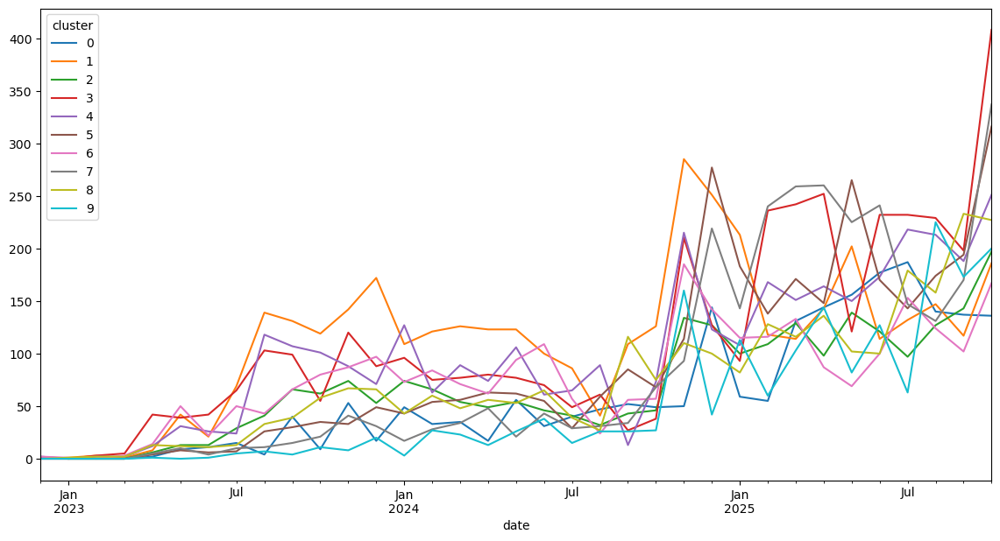

In [87]:
school_df['date'] = pd.to_datetime(school_df['created_at'])
monthly = school_df.groupby([school_df['date'].dt.to_period('M'), 'cluster']).size().unstack().fillna(0)
monthly.plot(figsize=(14,7))


In [48]:
import os
os.environ["TOKENIZERS_PARALLELISM"] = "false"

import re
import pandas as pd
import spacy
from bertopic import BERTopic
from sklearn.feature_extraction.text import CountVectorizer
from sentence_transformers import SentenceTransformer
from umap import UMAP


In [49]:
def clean_text(text):
    text = str(text)
    text = re.sub(r"http\S+", "", text)
    text = re.sub(r"@\w+", "", text)
    text = re.sub(r"#\w+", "", text)
    text = re.sub(r"&[a-z]+;", "", text)
    text = re.sub(r"[^\x00-\x7F]+", "", text)
    text = re.sub(r"\s+", " ", text).strip()
    return text

school_df["cleaned_text"] = school_df["cleaned_text"].apply(clean_text)


In [50]:
school_df["len"] = school_df["cleaned_text"].str.len()
school_df = school_df[(school_df["len"] > 10) & (school_df["len"] < 500)]
docs = school_df["cleaned_text"].tolist()


In [51]:
nlp = spacy.load("en_core_web_sm", disable=["ner", "parser"])
nlp.max_length = 500_000

def pos_tokenizer(text):
    doc = nlp(text)
    return [token.lemma_ for token in doc if token.pos_ in ("NOUN", "ADJ", "VERB")]


In [52]:
vectorizer = CountVectorizer(
    tokenizer=pos_tokenizer,
    stop_words="english",
    max_features=3000,
    min_df=3
)


In [53]:
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")


In [54]:
umap_model = UMAP(
    n_neighbors=15,
    n_components=5,
    metric="cosine",
    low_memory=True,
    random_state=42
)


In [55]:
topic_model = BERTopic(
    language="english",
    embedding_model=embedding_model,
    vectorizer_model=vectorizer,
    umap_model=umap_model,
    min_topic_size=15,
    top_n_words=10,
    calculate_probabilities=False
)

topics, _ = topic_model.fit_transform(docs)
school_df["topic"] = topics


Exception ignored in: <function ResourceTracker.__del__ at 0x103215da0>
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 82, in __del__
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 91, in _stop
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 116, in _stop_locked
ChildProcessError: [Errno 10] No child processes
Exception ignored in: <function ResourceTracker.__del__ at 0x1069c5da0>
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 82, in __del__
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 91, in _stop
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 116, in _stop_locked
ChildProcessError: [Errno 10] No child processes
Exception ignored in: <function ResourceTracker.__del__ at 0x1077e9da0>
Traceback (most recent call last

ValueError: [E088] Text of length 3312940 exceeds maximum of 500000. The parser and NER models require roughly 1GB of temporary memory per 100,000 characters in the input. This means long texts may cause memory allocation errors. If you're not using the parser or NER, it's probably safe to increase the `nlp.max_length` limit. The limit is in number of characters, so you can check whether your inputs are too long by checking `len(text)`.

In [56]:
nlp.max_length = 10_000_000  # 10 million chars, safe for your short posts


In [57]:
# Drop empty / NaN rows
school_df = school_df[school_df["cleaned_text"].notna()]

# Keep only posts under 500 characters
school_df = school_df[school_df["cleaned_text"].str.len() < 500]

# Reset index
school_df = school_df.reset_index(drop=True)

# Convert to list for BERTopic
docs = school_df["cleaned_text"].tolist()


In [58]:
topics, _ = topic_model.fit_transform(docs)
school_df["topic"] = topics


In [59]:
topic_info = topic_model.get_topic_info()
print(topic_info)

     Topic  Count                                     Name  \
0       -1  15407                    -1_chatgpt_use_llm_ai   
1        0   1774        0_gemini_minute_degree_retrograde   
2        1    696                 1_chatgpt_use_ai_student   
3        2    633           2_ai_education_teacher_student   
4        3    554              3_deepseek_chinese_model_r1   
..     ...    ...                                      ...   
133    132     16          132_multiple_mistral_client_api   
134    133     15         133_software_map_code_autonomous   
135    134     15         134_performance_loss_meta_memory   
136    135     15     135_general_reach_intelligence_level   
137    136     15  136_radiology_patient_medical_test_tube   

                                                                                     Representation  \
0                               [chatgpt, use, llm, ai, study, student, class, school, work, write]   
1                     [gemini, minute, degree, re

Exception ignored in: <function ResourceTracker.__del__ at 0x102549da0>
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 82, in __del__
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 91, in _stop
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 116, in _stop_locked
ChildProcessError: [Errno 10] No child processes
Exception ignored in: <function ResourceTracker.__del__ at 0x102601da0>
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 82, in __del__
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 91, in _stop
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 116, in _stop_locked
ChildProcessError: [Errno 10] No child processes
Exception ignored in: <function ResourceTracker.__del__ at 0x11105dda0>
Traceback (most recent call last

In [60]:
# ------------------------------
# 0️⃣ Environment & imports
# ------------------------------
import os
os.environ["TOKENIZERS_PARALLELISM"] = "false"

import re
import pandas as pd
import spacy
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from sklearn.feature_extraction.text import CountVectorizer
from umap import UMAP
import hdbscan

# ------------------------------
# 1️⃣ Load spaCy & set safe max_length
# ------------------------------
nlp = spacy.load("en_core_web_sm", disable=["ner", "parser"])  # disable heavy models
nlp.max_length = 10_000_000  # 10 million chars for safety

# ------------------------------
# 2️⃣ Clean & filter posts
# ------------------------------
def clean_text(text):
    text = str(text)
    text = text.lower()
    text = re.sub(r"http\S+", "", text)  # remove URLs
    text = re.sub(r"@\w+", "", text)     # remove mentions
    text = re.sub(r"#\w+", "", text)     # remove hashtags
    text = re.sub(r"[^\x00-\x7F]+", "", text)  # remove non-ascii chars
    text = re.sub(r"\s+", " ", text).strip()   # normalize whitespace
    return text

# Apply cleaning
school_df["cleaned_text"] = school_df["cleaned_text"].apply(clean_text)

# Remove empty / too short / too long posts
school_df = school_df[school_df["cleaned_text"].str.len().between(10, 500)].reset_index(drop=True)

# Convert to list
docs = school_df["cleaned_text"].tolist()

# ------------------------------
# 3️⃣ Define POS-based tokenizer
# ------------------------------
def pos_tokenizer(text):
    doc = nlp(text)
    # keep nouns, verbs, adjectives (meaningful words)
    return [token.lemma_ for token in doc if token.pos_ in ("NOUN", "VERB", "ADJ")]

# ------------------------------
# 4️⃣ Vectorizer (with TF-IDF)
# ------------------------------
vectorizer = CountVectorizer(
    tokenizer=pos_tokenizer,
    stop_words="english",
    max_features=3000,
    min_df=3
)

# ------------------------------
# 5️⃣ Embedding model (short text optimized)
# ------------------------------
embedding_model = SentenceTransformer("all-mpnet-base-v2")

# ------------------------------
# 6️⃣ UMAP & HDBSCAN (single-threaded, macOS-safe)
# ------------------------------
umap_model = UMAP(
    n_neighbors=15,
    n_components=5,
    metric="cosine",
    random_state=42,
    low_memory=True,
    n_jobs=1
)

hdbscan_model = hdbscan.HDBSCAN(
    min_cluster_size=15,
    prediction_data=True,
    core_dist_n_jobs=1
)

# ------------------------------
# 7️⃣ Fit BERTopic
# ------------------------------
topic_model = BERTopic(
    language="english",
    embedding_model=embedding_model,
    vectorizer_model=vectorizer,
    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    min_topic_size=15,
    top_n_words=10,
    calculate_probabilities=True,  # useful for inspecting soft topic assignments
    verbose=True
)

topics, probs = topic_model.fit_transform(docs)
school_df["topic"] = topics

# ------------------------------
# 8️⃣ Optional: Reduce similar topics
# ------------------------------
topic_model.reduce_topics(docs, nr_topics=50)

# ------------------------------
# 9️⃣ Inspect top words for first 10 topics
# ------------------------------
for t in range(10):
    print(f"\n=== Topic {t} ===")
    print(topic_model.get_topic(t))

# ------------------------------
# 🔟 Optional: visualize topics
# ------------------------------
topic_model.visualize_topics()
topic_model.visualize_barchart(top_n_topics=10)


2025-11-30 13:52:37,170 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/898 [00:00<?, ?it/s]

2025-11-30 13:58:40,764 - BERTopic - Embedding - Completed ✓
2025-11-30 13:58:40,769 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-11-30 13:59:03,298 - BERTopic - Dimensionality - Completed ✓
2025-11-30 13:59:03,307 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-11-30 13:59:25,972 - BERTopic - Cluster - Completed ✓
2025-11-30 13:59:26,008 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-11-30 14:00:58,041 - BERTopic - Representation - Completed ✓
2025-11-30 14:01:34,508 - BERTopic - Topic reduction - Reducing number of topics
2025-11-30 14:01:34,585 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-11-30 14:03:01,231 - BERTopic - Representation - Completed ✓
2025-11-30 14:03:01,247 - BERTopic - Topic reduction - Reduced number of topics from 163 to 50



=== Topic 0 ===
[('ai', np.float64(0.03334538530172326)), ('education', np.float64(0.019187408019789836)), ('student', np.float64(0.01884023905792869)), ('teacher', np.float64(0.018089023150849246)), ('use', np.float64(0.016719493941718552)), ('tool', np.float64(0.012860034786883549)), ('school', np.float64(0.011913330964539214)), ('chatbot', np.float64(0.011485538440816312)), ('generative', np.float64(0.010860371823107498)), ('chatgpt', np.float64(0.010823155852603244))]

=== Topic 1 ===
[('chatgpt', np.float64(0.04621108642466265)), ('student', np.float64(0.02713060886894471)), ('use', np.float64(0.025958942964086202)), ('write', np.float64(0.025531920091447516)), ('essay', np.float64(0.022585910020729415)), ('writing', np.float64(0.01616260892600856)), ('assignment', np.float64(0.013418351023437932)), ('make', np.float64(0.01331208798704442)), ('tell', np.float64(0.013140518465473415)), ('ask', np.float64(0.012691467136051529))]

=== Topic 2 ===
[('llm', np.float64(0.05220633185489